In [1]:
%matplotlib inline

import numpy as np
import copy
import matplotlib.pyplot as plt
import pickle
import random
import torch
from utils import torch_from_numpy
import datetime

from config import cfg_seed, cfg_env, cfg_z_dim, cfg_default_lr, cfg_default_early
seed = cfg_seed
env_str=cfg_env
default_lr=cfg_default_lr
default_early=cfg_default_early

from config import cfg_alpha
alpha=cfg_alpha

num_iter_max=200000

env_name = 'CustomPendulum-v0'
figfilenamehead = "fig_policy_evaluation_"+env_str+"_"

loss_list = []
normalized_loss_list = []

print("alpha",alpha)
print(datetime.datetime.now())

alpha 0.1
2023-06-06 12:07:42.674814


In [2]:
import gym
import custom_gym
env = gym.make(env_name)

random.seed(seed)
np.random.seed(seed)

env.seed(seed)
env.action_space.seed(seed)
torch.manual_seed(seed)


s_dim = env.reset().flatten().shape[0]
a_dim = env.action_space.sample().flatten().shape[0]
z_dim = cfg_z_dim
print(s_dim, a_dim, z_dim)



2 1 1


/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/core.py:329: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:174: UserWarning: WARN: Future gym versions will require that `Env.reset` can be passed a `seed` instead of using `Env.seed` for resetting the environment random number generator.
  logger.warn(
/home/proxima-hishinuma/anaconda3/

In [3]:


from sac import SAC
agent = SAC(env.observation_space.shape[0], env.action_space)
agent.load_checkpoint(ckpt_path="checkpoints/sac_checkpoint_custom_"+env_str+"_mdp_")


offline_data = pickle.load(open("offline_data_"+env_str+".pkl","rb"))
debug_info = pickle.load(open("offline_data_debug_info_"+env_str+".pkl","rb"))
debug_info = np.array(debug_info)

Loading models from checkpoints/sac_checkpoint_custom_pendulum_mdp_


In [4]:
args_init_dict = {
    "offline_data": offline_data,
    "s_dim": s_dim,
    "a_dim": a_dim,
    "z_dim": z_dim,
    #              "policy":agent.select_action,
    "mdp_policy":agent.policy.my_np_select_action,
    "bamdp_policy":None,
    "debug_info":debug_info,
    "env" : env,
    "ckpt_suffix" : env_str,
}
# import vi_base
# vi = vi_base.baseVI(args_init_dict)
import vi_iw
iwvi = vi_iw.iwVI(args_init_dict)

iwvi.load_base(ckpt_key="unweighted") # 重みなし学習結果だけをロード

dec: h_dim 16
base load ckpt ckpt_basevi_pendulum_unweighted
base load self.initial_belief.data.sum() tensor(-6.8937)
base load dec.state_dict()['net_phat.0.weight'].sum() tensor(1.0739)
penalty_target_min tensor(-5.8382) penalty_target_max tensor(21.6424)
train_loss:  -4.010319100385905
valid_loss:  -4.853664096069337
h_min_tilde -5.838158 ell_tilde -4.178988099522591 kappa_tilde 0.000776344628850762


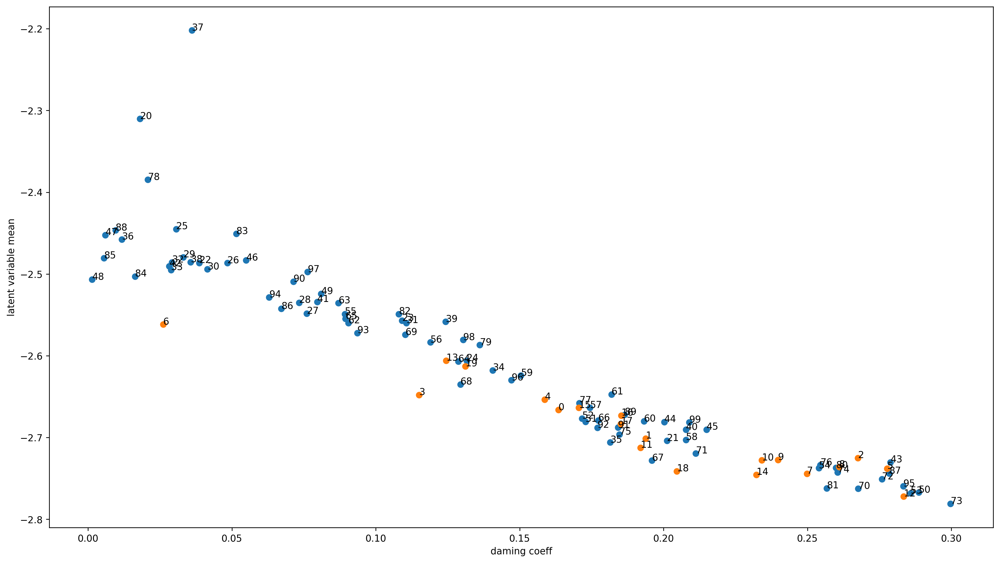

[0.16346495 0.19376823 0.2675319  0.11503246 0.15866848 0.27767899
 0.02613879 0.24978595 0.26100364 0.23974757]
[0.23415875 0.19197631 0.28340068 0.12439858 0.23227011 0.17053018
 0.18529065 0.1850802  0.20454609 0.13110959]
[0.01806764 0.20119136 0.03867789 0.10911323 0.13158045 0.03061344
 0.04839286 0.07598748 0.07332768 0.03311254]
[0.04145489 0.11061755 0.02913038 0.02882952 0.14059536 0.18145366
 0.01175634 0.03605897 0.03561832 0.1242789 ]
[0.20774164 0.07961685 0.02818215 0.27878886 0.20022311 0.21489816
 0.05495741 0.00603226 0.00140864 0.08100239]
[0.28865656 0.1728472  0.17167557 0.2858247  0.2539226  0.08923109
 0.11895172 0.17438186 0.20775948 0.15039731]
[0.19319706 0.18191796 0.09047245 0.08702328 0.12863061 0.0894847
 0.17726183 0.19596025 0.12942553 0.11026856]
[0.26757701 0.21116658 0.27584478 0.2996541  0.26043782 0.18466787
 0.25440247 0.17073022 0.0207501  0.1360628 ]
[0.2599147  0.256741   0.10799342 0.0514889  0.0163014  0.00555654
 0.06717741 0.27842439 0.00955

In [5]:
plt.figure(figsize=(18,10), dpi=250)
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()
plt.xlabel("daming coeff")
plt.ylabel("latent variable mean")

plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.xlim([-0.05,0.35])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter0.png")
plt.savefig(figfilenamehead+"damping_latent_iter0.eps")
# plt.savefig(figfilenamehead+"damping_latent_iter0.pdf")
plt.show()

for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [6]:
iwvi.get_real_rollout_mdppolicy_data()

0  1  2  

/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:227: DeprecationWarning: WARN: Core environment is written in old step API which returns one bool instead of two. It is recommended to rewrite the environment with new step API. 
  logger.deprecation(
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(done, (bool, np.bool8)):
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:141: UserWarning: WARN: The obs returned by the `step()` method was expecting numpy array dtype to be float32, actual type: float64
  logger.warn(
/home/proxima-hishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:165: UserWarning: WARN: The obs returned by the `step()` method is not within the observ

3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   


In [7]:
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_data_fixlen()
# simdata0d = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_data_fixlen()
# simdata0e = copy.deepcopy(iwvi.simenv_rolloutdata)



0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56

実環境方策rollout vs Sim環境方策rollout


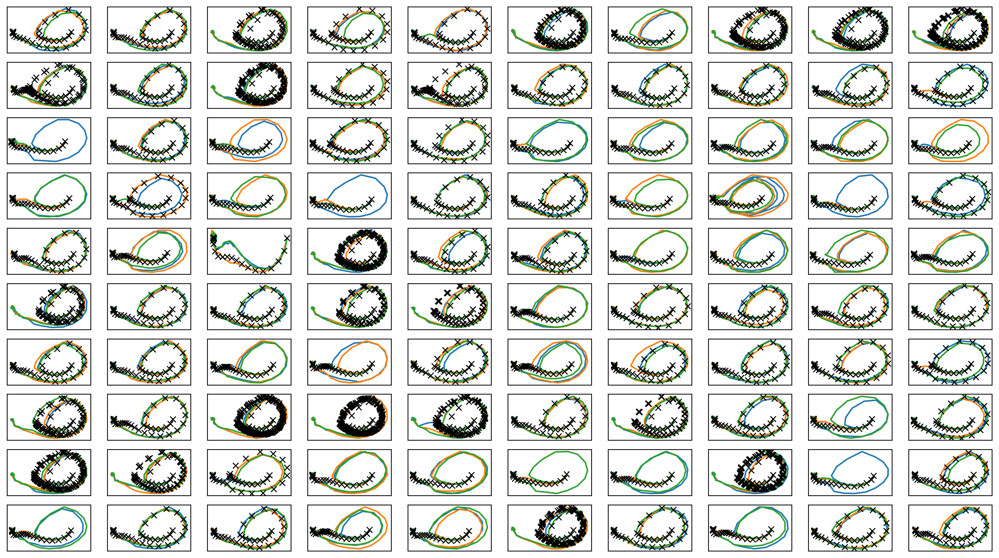

In [8]:
fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
    ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 
#     ax_list[-1].plot(simdata0d[i][:,0], simdata0d[i][:,1]) 
#     ax_list[-1].plot(simdata0e[i][:,0], simdata0e[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter0.png")
plt.savefig(figfilenamehead+"joint_iter0.eps")
# plt.savefig(figfilenamehead+"joint_iter0.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

In [9]:
print(datetime.datetime.now())

2023-06-06 12:08:13.068748


# Iter 1

In [10]:
iwvi.get_sim_rollout_mdppolicy_data_randomstop()

0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   


In [11]:
iwvi.train_ratio(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, policy=agent.select_action)


train: iter 0  trainloss 1.13500  validloss 1.42324±0.00000  bestvalidloss 1.42324  last_update 0
train: iter 1  trainloss 0.71010  validloss 0.78291±0.00000  bestvalidloss 0.78291  last_update 0
train: iter 2  trainloss 0.63605  validloss 0.60112±0.00000  bestvalidloss 0.60112  last_update 0
train: iter 3  trainloss 0.60405  validloss 0.55012±0.00000  bestvalidloss 0.55012  last_update 0
train: iter 4  trainloss 0.57825  validloss 0.51406±0.00000  bestvalidloss 0.51406  last_update 0
train: iter 5  trainloss 0.55449  validloss 0.48293±0.00000  bestvalidloss 0.48293  last_update 0
train: iter 6  trainloss 0.53076  validloss 0.45425±0.00000  bestvalidloss 0.45425  last_update 0
train: iter 7  trainloss 0.50686  validloss 0.43163±0.00000  bestvalidloss 0.43163  last_update 0
train: iter 8  trainloss 0.48282  validloss 0.40442±0.00000  bestvalidloss 0.40442  last_update 0
train: iter 9  trainloss 0.46256  validloss 0.38495±0.00000  bestvalidloss 0.38495  last_update 0
train: iter 10  trai

train: iter 83  trainloss 0.20470  validloss 0.18980±0.00000  bestvalidloss 0.18435  last_update 9
train: iter 84  trainloss 0.20325  validloss 0.18469±0.00000  bestvalidloss 0.18435  last_update 10
train: iter 85  trainloss 0.20471  validloss 0.18724±0.00000  bestvalidloss 0.18435  last_update 11
train: iter 86  trainloss 0.20730  validloss 0.20770±0.00000  bestvalidloss 0.18435  last_update 12
train: iter 87  trainloss 0.20214  validloss 0.18483±0.00000  bestvalidloss 0.18435  last_update 13
train: iter 88  trainloss 0.20689  validloss 0.18492±0.00000  bestvalidloss 0.18435  last_update 14
train: iter 89  trainloss 0.20080  validloss 0.18180±0.00000  bestvalidloss 0.18180  last_update 0
train: iter 90  trainloss 0.20180  validloss 0.18809±0.00000  bestvalidloss 0.18180  last_update 1
train: iter 91  trainloss 0.20245  validloss 0.18122±0.00000  bestvalidloss 0.18122  last_update 0
train: iter 92  trainloss 0.20695  validloss 0.17912±0.00000  bestvalidloss 0.17912  last_update 0
train

train: iter 167  trainloss 0.18687  validloss 0.16873±0.00000  bestvalidloss 0.16575  last_update 1
train: iter 168  trainloss 0.18975  validloss 0.16411±0.00000  bestvalidloss 0.16411  last_update 0
train: iter 169  trainloss 0.18959  validloss 0.18135±0.00000  bestvalidloss 0.16411  last_update 1
train: iter 170  trainloss 0.18509  validloss 0.16740±0.00000  bestvalidloss 0.16411  last_update 2
train: iter 171  trainloss 0.18356  validloss 0.16692±0.00000  bestvalidloss 0.16411  last_update 3
train: iter 172  trainloss 0.18610  validloss 0.17299±0.00000  bestvalidloss 0.16411  last_update 4
train: iter 173  trainloss 0.18713  validloss 0.16573±0.00000  bestvalidloss 0.16411  last_update 5
train: iter 174  trainloss 0.18479  validloss 0.16969±0.00000  bestvalidloss 0.16411  last_update 6
train: iter 175  trainloss 0.18329  validloss 0.16954±0.00000  bestvalidloss 0.16411  last_update 7
train: iter 176  trainloss 0.18593  validloss 0.16691±0.00000  bestvalidloss 0.16411  last_update 8


train: iter 249  trainloss 0.17540  validloss 0.15661±0.00000  bestvalidloss 0.15633  last_update 12
train: iter 250  trainloss 0.17665  validloss 0.17019±0.00000  bestvalidloss 0.15633  last_update 13
train: iter 251  trainloss 0.17586  validloss 0.16021±0.00000  bestvalidloss 0.15633  last_update 14
train: iter 252  trainloss 0.17608  validloss 0.15683±0.00000  bestvalidloss 0.15633  last_update 15
train: iter 253  trainloss 0.17687  validloss 0.15962±0.00000  bestvalidloss 0.15633  last_update 16
train: iter 254  trainloss 0.17988  validloss 0.15759±0.00000  bestvalidloss 0.15633  last_update 17
train: iter 255  trainloss 0.17832  validloss 0.15700±0.00000  bestvalidloss 0.15633  last_update 18
train: iter 256  trainloss 0.17753  validloss 0.16663±0.00000  bestvalidloss 0.15633  last_update 19
train: iter 257  trainloss 0.17418  validloss 0.15858±0.00000  bestvalidloss 0.15633  last_update 20
train: iter 258  trainloss 0.18033  validloss 0.15606±0.00000  bestvalidloss 0.15606  last_

train: iter 331  trainloss 0.16829  validloss 0.15041±0.00000  bestvalidloss 0.14892  last_update 12
train: iter 332  trainloss 0.17079  validloss 0.15245±0.00000  bestvalidloss 0.14892  last_update 13
train: iter 333  trainloss 0.16976  validloss 0.15406±0.00000  bestvalidloss 0.14892  last_update 14
train: iter 334  trainloss 0.16893  validloss 0.15189±0.00000  bestvalidloss 0.14892  last_update 15
train: iter 335  trainloss 0.17382  validloss 0.16272±0.00000  bestvalidloss 0.14892  last_update 16
train: iter 336  trainloss 0.17093  validloss 0.15010±0.00000  bestvalidloss 0.14892  last_update 17
train: iter 337  trainloss 0.17381  validloss 0.15188±0.00000  bestvalidloss 0.14892  last_update 18
train: iter 338  trainloss 0.16896  validloss 0.15130±0.00000  bestvalidloss 0.14892  last_update 19
train: iter 339  trainloss 0.17218  validloss 0.14830±0.00000  bestvalidloss 0.14830  last_update 0
train: iter 340  trainloss 0.16991  validloss 0.14721±0.00000  bestvalidloss 0.14721  last_u

train: iter 413  trainloss 0.16845  validloss 0.15192±0.00000  bestvalidloss 0.14266  last_update 3
train: iter 414  trainloss 0.16901  validloss 0.14468±0.00000  bestvalidloss 0.14266  last_update 4
train: iter 415  trainloss 0.16679  validloss 0.14772±0.00000  bestvalidloss 0.14266  last_update 5
train: iter 416  trainloss 0.16726  validloss 0.15263±0.00000  bestvalidloss 0.14266  last_update 6
train: iter 417  trainloss 0.16583  validloss 0.14448±0.00000  bestvalidloss 0.14266  last_update 7
train: iter 418  trainloss 0.16516  validloss 0.15354±0.00000  bestvalidloss 0.14266  last_update 8
train: iter 419  trainloss 0.16350  validloss 0.14770±0.00000  bestvalidloss 0.14266  last_update 9
train: iter 420  trainloss 0.16367  validloss 0.14669±0.00000  bestvalidloss 0.14266  last_update 10
train: iter 421  trainloss 0.16336  validloss 0.14431±0.00000  bestvalidloss 0.14266  last_update 11
train: iter 422  trainloss 0.16672  validloss 0.15054±0.00000  bestvalidloss 0.14266  last_update 

train: iter 496  trainloss 0.16080  validloss 0.14190±0.00000  bestvalidloss 0.13862  last_update 20
train: iter 497  trainloss 0.15918  validloss 0.14062±0.00000  bestvalidloss 0.13862  last_update 21
train: iter 498  trainloss 0.16451  validloss 0.15037±0.00000  bestvalidloss 0.13862  last_update 22
train: iter 499  trainloss 0.16392  validloss 0.15478±0.00000  bestvalidloss 0.13862  last_update 23
train: iter 500  trainloss 0.16032  validloss 0.14493±0.00000  bestvalidloss 0.13862  last_update 24
train: iter 501  trainloss 0.16077  validloss 0.14396±0.00000  bestvalidloss 0.13862  last_update 25
train: iter 502  trainloss 0.16073  validloss 0.14240±0.00000  bestvalidloss 0.13862  last_update 26
train: iter 503  trainloss 0.16144  validloss 0.14278±0.00000  bestvalidloss 0.13862  last_update 27
train: iter 504  trainloss 0.16094  validloss 0.14016±0.00000  bestvalidloss 0.13862  last_update 28
train: iter 505  trainloss 0.15867  validloss 0.14187±0.00000  bestvalidloss 0.13862  last_

train: iter 578  trainloss 0.15878  validloss 0.14023±0.00000  bestvalidloss 0.13739  last_update 8
train: iter 579  trainloss 0.15825  validloss 0.13895±0.00000  bestvalidloss 0.13739  last_update 9
train: iter 580  trainloss 0.15698  validloss 0.13960±0.00000  bestvalidloss 0.13739  last_update 10
train: iter 581  trainloss 0.16070  validloss 0.14219±0.00000  bestvalidloss 0.13739  last_update 11
train: iter 582  trainloss 0.16417  validloss 0.14572±0.00000  bestvalidloss 0.13739  last_update 12
train: iter 583  trainloss 0.15735  validloss 0.14029±0.00000  bestvalidloss 0.13739  last_update 13
train: iter 584  trainloss 0.15800  validloss 0.13851±0.00000  bestvalidloss 0.13739  last_update 14
train: iter 585  trainloss 0.15959  validloss 0.14699±0.00000  bestvalidloss 0.13739  last_update 15
train: iter 586  trainloss 0.15727  validloss 0.13761±0.00000  bestvalidloss 0.13739  last_update 16
train: iter 587  trainloss 0.15909  validloss 0.13893±0.00000  bestvalidloss 0.13739  last_up

train: iter 661  trainloss 0.15559  validloss 0.13683±0.00000  bestvalidloss 0.13487  last_update 59
train: iter 662  trainloss 0.15733  validloss 0.13555±0.00000  bestvalidloss 0.13487  last_update 60
train: iter 663  trainloss 0.15748  validloss 0.13645±0.00000  bestvalidloss 0.13487  last_update 61
train: iter 664  trainloss 0.15806  validloss 0.13517±0.00000  bestvalidloss 0.13487  last_update 62
train: iter 665  trainloss 0.15850  validloss 0.14082±0.00000  bestvalidloss 0.13487  last_update 63
train: iter 666  trainloss 0.15602  validloss 0.14871±0.00000  bestvalidloss 0.13487  last_update 64
train: iter 667  trainloss 0.15664  validloss 0.13875±0.00000  bestvalidloss 0.13487  last_update 65
train: iter 668  trainloss 0.15600  validloss 0.13605±0.00000  bestvalidloss 0.13487  last_update 66
train: iter 669  trainloss 0.15602  validloss 0.14648±0.00000  bestvalidloss 0.13487  last_update 67
train: iter 670  trainloss 0.15795  validloss 0.13630±0.00000  bestvalidloss 0.13487  last_

train: iter 743  trainloss 0.15305  validloss 0.13407±0.00000  bestvalidloss 0.13297  last_update 29
train: iter 744  trainloss 0.15392  validloss 0.13443±0.00000  bestvalidloss 0.13297  last_update 30
train: iter 745  trainloss 0.15557  validloss 0.13372±0.00000  bestvalidloss 0.13297  last_update 31
train: iter 746  trainloss 0.15585  validloss 0.14806±0.00000  bestvalidloss 0.13297  last_update 32
train: iter 747  trainloss 0.15167  validloss 0.13500±0.00000  bestvalidloss 0.13297  last_update 33
train: iter 748  trainloss 0.15897  validloss 0.13569±0.00000  bestvalidloss 0.13297  last_update 34
train: iter 749  trainloss 0.15500  validloss 0.13472±0.00000  bestvalidloss 0.13297  last_update 35
train: iter 750  trainloss 0.15454  validloss 0.13697±0.00000  bestvalidloss 0.13297  last_update 36
train: iter 751  trainloss 0.15490  validloss 0.13413±0.00000  bestvalidloss 0.13297  last_update 37
train: iter 752  trainloss 0.15555  validloss 0.13355±0.00000  bestvalidloss 0.13297  last_

train: iter 825  trainloss 0.15427  validloss 0.15205±0.00000  bestvalidloss 0.13089  last_update 64
train: iter 826  trainloss 0.15152  validloss 0.13477±0.00000  bestvalidloss 0.13089  last_update 65
train: iter 827  trainloss 0.15115  validloss 0.13459±0.00000  bestvalidloss 0.13089  last_update 66
train: iter 828  trainloss 0.15128  validloss 0.14263±0.00000  bestvalidloss 0.13089  last_update 67
train: iter 829  trainloss 0.15284  validloss 0.13737±0.00000  bestvalidloss 0.13089  last_update 68
train: iter 830  trainloss 0.15166  validloss 0.13370±0.00000  bestvalidloss 0.13089  last_update 69
train: iter 831  trainloss 0.15228  validloss 0.13421±0.00000  bestvalidloss 0.13089  last_update 70
train: iter 832  trainloss 0.15123  validloss 0.14126±0.00000  bestvalidloss 0.13089  last_update 71
train: iter 833  trainloss 0.15361  validloss 0.13884±0.00000  bestvalidloss 0.13089  last_update 72
train: iter 834  trainloss 0.15182  validloss 0.13183±0.00000  bestvalidloss 0.13089  last_

train: iter 907  trainloss 0.15383  validloss 0.13488±0.00000  bestvalidloss 0.12996  last_update 24
train: iter 908  trainloss 0.15235  validloss 0.13114±0.00000  bestvalidloss 0.12996  last_update 25
train: iter 909  trainloss 0.15377  validloss 0.13454±0.00000  bestvalidloss 0.12996  last_update 26
train: iter 910  trainloss 0.15299  validloss 0.13114±0.00000  bestvalidloss 0.12996  last_update 27
train: iter 911  trainloss 0.15294  validloss 0.13196±0.00000  bestvalidloss 0.12996  last_update 28
train: iter 912  trainloss 0.14974  validloss 0.13316±0.00000  bestvalidloss 0.12996  last_update 29
train: iter 913  trainloss 0.15172  validloss 0.13522±0.00000  bestvalidloss 0.12996  last_update 30
train: iter 914  trainloss 0.15053  validloss 0.13055±0.00000  bestvalidloss 0.12996  last_update 31
train: iter 915  trainloss 0.15114  validloss 0.13304±0.00000  bestvalidloss 0.12996  last_update 32
train: iter 916  trainloss 0.15223  validloss 0.13250±0.00000  bestvalidloss 0.12996  last_

train: iter 989  trainloss 0.14926  validloss 0.13182±0.00000  bestvalidloss 0.12819  last_update 3
train: iter 990  trainloss 0.15348  validloss 0.13218±0.00000  bestvalidloss 0.12819  last_update 4
train: iter 991  trainloss 0.14817  validloss 0.13526±0.00000  bestvalidloss 0.12819  last_update 5
train: iter 992  trainloss 0.14901  validloss 0.12956±0.00000  bestvalidloss 0.12819  last_update 6
train: iter 993  trainloss 0.14928  validloss 0.13546±0.00000  bestvalidloss 0.12819  last_update 7
train: iter 994  trainloss 0.14883  validloss 0.13515±0.00000  bestvalidloss 0.12819  last_update 8
train: iter 995  trainloss 0.14856  validloss 0.13106±0.00000  bestvalidloss 0.12819  last_update 9
train: iter 996  trainloss 0.14983  validloss 0.13600±0.00000  bestvalidloss 0.12819  last_update 10
train: iter 997  trainloss 0.15172  validloss 0.12796±0.00000  bestvalidloss 0.12796  last_update 0
train: iter 998  trainloss 0.14910  validloss 0.14494±0.00000  bestvalidloss 0.12796  last_update 1

train: iter 1071  trainloss 0.14748  validloss 0.12747±0.00000  bestvalidloss 0.12634  last_update 16
train: iter 1072  trainloss 0.14976  validloss 0.12891±0.00000  bestvalidloss 0.12634  last_update 17
train: iter 1073  trainloss 0.14745  validloss 0.12952±0.00000  bestvalidloss 0.12634  last_update 18
train: iter 1074  trainloss 0.14658  validloss 0.12985±0.00000  bestvalidloss 0.12634  last_update 19
train: iter 1075  trainloss 0.15192  validloss 0.12919±0.00000  bestvalidloss 0.12634  last_update 20
train: iter 1076  trainloss 0.14887  validloss 0.13090±0.00000  bestvalidloss 0.12634  last_update 21
train: iter 1077  trainloss 0.14620  validloss 0.12893±0.00000  bestvalidloss 0.12634  last_update 22
train: iter 1078  trainloss 0.14870  validloss 0.12956±0.00000  bestvalidloss 0.12634  last_update 23
train: iter 1079  trainloss 0.14795  validloss 0.12895±0.00000  bestvalidloss 0.12634  last_update 24
train: iter 1080  trainloss 0.14683  validloss 0.12937±0.00000  bestvalidloss 0.12

train: iter 1152  trainloss 0.14526  validloss 0.12600±0.00000  bestvalidloss 0.12477  last_update 8
train: iter 1153  trainloss 0.14671  validloss 0.12978±0.00000  bestvalidloss 0.12477  last_update 9
train: iter 1154  trainloss 0.14691  validloss 0.12474±0.00000  bestvalidloss 0.12474  last_update 0
train: iter 1155  trainloss 0.15345  validloss 0.12651±0.00000  bestvalidloss 0.12474  last_update 1
train: iter 1156  trainloss 0.14660  validloss 0.12517±0.00000  bestvalidloss 0.12474  last_update 2
train: iter 1157  trainloss 0.14556  validloss 0.12585±0.00000  bestvalidloss 0.12474  last_update 3
train: iter 1158  trainloss 0.14601  validloss 0.13084±0.00000  bestvalidloss 0.12474  last_update 4
train: iter 1159  trainloss 0.14892  validloss 0.12792±0.00000  bestvalidloss 0.12474  last_update 5
train: iter 1160  trainloss 0.14533  validloss 0.13131±0.00000  bestvalidloss 0.12474  last_update 6
train: iter 1161  trainloss 0.14616  validloss 0.13668±0.00000  bestvalidloss 0.12474  last

train: iter 1233  trainloss 0.14551  validloss 0.12462±0.00000  bestvalidloss 0.12428  last_update 46
train: iter 1234  trainloss 0.14421  validloss 0.12668±0.00000  bestvalidloss 0.12428  last_update 47
train: iter 1235  trainloss 0.14612  validloss 0.12855±0.00000  bestvalidloss 0.12428  last_update 48
train: iter 1236  trainloss 0.14492  validloss 0.12538±0.00000  bestvalidloss 0.12428  last_update 49
train: iter 1237  trainloss 0.14520  validloss 0.12370±0.00000  bestvalidloss 0.12370  last_update 0
train: iter 1238  trainloss 0.14957  validloss 0.12583±0.00000  bestvalidloss 0.12370  last_update 1
train: iter 1239  trainloss 0.14506  validloss 0.12480±0.00000  bestvalidloss 0.12370  last_update 2
train: iter 1240  trainloss 0.14517  validloss 0.13014±0.00000  bestvalidloss 0.12370  last_update 3
train: iter 1241  trainloss 0.14478  validloss 0.12472±0.00000  bestvalidloss 0.12370  last_update 4
train: iter 1242  trainloss 0.14471  validloss 0.13201±0.00000  bestvalidloss 0.12370  

train: iter 1315  trainloss 0.14490  validloss 0.13277±0.00000  bestvalidloss 0.12347  last_update 29
train: iter 1316  trainloss 0.14312  validloss 0.12663±0.00000  bestvalidloss 0.12347  last_update 30
train: iter 1317  trainloss 0.14343  validloss 0.12446±0.00000  bestvalidloss 0.12347  last_update 31
train: iter 1318  trainloss 0.14305  validloss 0.12541±0.00000  bestvalidloss 0.12347  last_update 32
train: iter 1319  trainloss 0.14256  validloss 0.13403±0.00000  bestvalidloss 0.12347  last_update 33
train: iter 1320  trainloss 0.14603  validloss 0.12434±0.00000  bestvalidloss 0.12347  last_update 34
train: iter 1321  trainloss 0.14538  validloss 0.12815±0.00000  bestvalidloss 0.12347  last_update 35
train: iter 1322  trainloss 0.14589  validloss 0.12872±0.00000  bestvalidloss 0.12347  last_update 36
train: iter 1323  trainloss 0.14495  validloss 0.12616±0.00000  bestvalidloss 0.12347  last_update 37
train: iter 1324  trainloss 0.14396  validloss 0.12829±0.00000  bestvalidloss 0.12

train: iter 1396  trainloss 0.14379  validloss 0.12488±0.00000  bestvalidloss 0.12258  last_update 29
train: iter 1397  trainloss 0.14687  validloss 0.12552±0.00000  bestvalidloss 0.12258  last_update 30
train: iter 1398  trainloss 0.14738  validloss 0.12567±0.00000  bestvalidloss 0.12258  last_update 31
train: iter 1399  trainloss 0.14534  validloss 0.13739±0.00000  bestvalidloss 0.12258  last_update 32
train: iter 1400  trainloss 0.14384  validloss 0.12672±0.00000  bestvalidloss 0.12258  last_update 33
train: iter 1401  trainloss 0.14205  validloss 0.12350±0.00000  bestvalidloss 0.12258  last_update 34
train: iter 1402  trainloss 0.14456  validloss 0.12885±0.00000  bestvalidloss 0.12258  last_update 35
train: iter 1403  trainloss 0.14399  validloss 0.13352±0.00000  bestvalidloss 0.12258  last_update 36
train: iter 1404  trainloss 0.14378  validloss 0.12409±0.00000  bestvalidloss 0.12258  last_update 37
train: iter 1405  trainloss 0.14146  validloss 0.12438±0.00000  bestvalidloss 0.12

train: iter 1477  trainloss 0.14195  validloss 0.12311±0.00000  bestvalidloss 0.12156  last_update 30
train: iter 1478  trainloss 0.14316  validloss 0.12433±0.00000  bestvalidloss 0.12156  last_update 31
train: iter 1479  trainloss 0.14234  validloss 0.12512±0.00000  bestvalidloss 0.12156  last_update 32
train: iter 1480  trainloss 0.14228  validloss 0.12437±0.00000  bestvalidloss 0.12156  last_update 33
train: iter 1481  trainloss 0.14262  validloss 0.12207±0.00000  bestvalidloss 0.12156  last_update 34
train: iter 1482  trainloss 0.14073  validloss 0.12308±0.00000  bestvalidloss 0.12156  last_update 35
train: iter 1483  trainloss 0.14136  validloss 0.12953±0.00000  bestvalidloss 0.12156  last_update 36
train: iter 1484  trainloss 0.14150  validloss 0.12352±0.00000  bestvalidloss 0.12156  last_update 37
train: iter 1485  trainloss 0.14358  validloss 0.13241±0.00000  bestvalidloss 0.12156  last_update 38
train: iter 1486  trainloss 0.14448  validloss 0.12547±0.00000  bestvalidloss 0.12

train: iter 1558  trainloss 0.14609  validloss 0.12288±0.00000  bestvalidloss 0.12066  last_update 3
train: iter 1559  trainloss 0.14005  validloss 0.12845±0.00000  bestvalidloss 0.12066  last_update 4
train: iter 1560  trainloss 0.14181  validloss 0.12877±0.00000  bestvalidloss 0.12066  last_update 5
train: iter 1561  trainloss 0.14116  validloss 0.12548±0.00000  bestvalidloss 0.12066  last_update 6
train: iter 1562  trainloss 0.14134  validloss 0.12719±0.00000  bestvalidloss 0.12066  last_update 7
train: iter 1563  trainloss 0.14060  validloss 0.12682±0.00000  bestvalidloss 0.12066  last_update 8
train: iter 1564  trainloss 0.14057  validloss 0.12547±0.00000  bestvalidloss 0.12066  last_update 9
train: iter 1565  trainloss 0.14036  validloss 0.12211±0.00000  bestvalidloss 0.12066  last_update 10
train: iter 1566  trainloss 0.14070  validloss 0.12130±0.00000  bestvalidloss 0.12066  last_update 11
train: iter 1567  trainloss 0.14214  validloss 0.12585±0.00000  bestvalidloss 0.12066  la

train: iter 1639  trainloss 0.14060  validloss 0.12847±0.00000  bestvalidloss 0.11967  last_update 4
train: iter 1640  trainloss 0.14158  validloss 0.15057±0.00000  bestvalidloss 0.11967  last_update 5
train: iter 1641  trainloss 0.14031  validloss 0.12183±0.00000  bestvalidloss 0.11967  last_update 6
train: iter 1642  trainloss 0.14077  validloss 0.12180±0.00000  bestvalidloss 0.11967  last_update 7
train: iter 1643  trainloss 0.14198  validloss 0.12766±0.00000  bestvalidloss 0.11967  last_update 8
train: iter 1644  trainloss 0.13963  validloss 0.12525±0.00000  bestvalidloss 0.11967  last_update 9
train: iter 1645  trainloss 0.14084  validloss 0.12204±0.00000  bestvalidloss 0.11967  last_update 10
train: iter 1646  trainloss 0.14183  validloss 0.12094±0.00000  bestvalidloss 0.11967  last_update 11
train: iter 1647  trainloss 0.13962  validloss 0.12588±0.00000  bestvalidloss 0.11967  last_update 12
train: iter 1648  trainloss 0.14025  validloss 0.12488±0.00000  bestvalidloss 0.11967  l

train: iter 1720  trainloss 0.13985  validloss 0.12430±0.00000  bestvalidloss 0.11967  last_update 85
train: iter 1721  trainloss 0.13805  validloss 0.12007±0.00000  bestvalidloss 0.11967  last_update 86
train: iter 1722  trainloss 0.14008  validloss 0.14161±0.00000  bestvalidloss 0.11967  last_update 87
train: iter 1723  trainloss 0.14057  validloss 0.12198±0.00000  bestvalidloss 0.11967  last_update 88
train: iter 1724  trainloss 0.13902  validloss 0.12669±0.00000  bestvalidloss 0.11967  last_update 89
train: iter 1725  trainloss 0.13990  validloss 0.12309±0.00000  bestvalidloss 0.11967  last_update 90
train: iter 1726  trainloss 0.14002  validloss 0.12236±0.00000  bestvalidloss 0.11967  last_update 91
train: iter 1727  trainloss 0.13894  validloss 0.12384±0.00000  bestvalidloss 0.11967  last_update 92
train: iter 1728  trainloss 0.14206  validloss 0.11884±0.00000  bestvalidloss 0.11884  last_update 0
train: iter 1729  trainloss 0.13988  validloss 0.12012±0.00000  bestvalidloss 0.118

train: iter 1801  trainloss 0.13810  validloss 0.13645±0.00000  bestvalidloss 0.11884  last_update 73
train: iter 1802  trainloss 0.13785  validloss 0.12269±0.00000  bestvalidloss 0.11884  last_update 74
train: iter 1803  trainloss 0.13752  validloss 0.12189±0.00000  bestvalidloss 0.11884  last_update 75
train: iter 1804  trainloss 0.13688  validloss 0.12243±0.00000  bestvalidloss 0.11884  last_update 76
train: iter 1805  trainloss 0.13831  validloss 0.12316±0.00000  bestvalidloss 0.11884  last_update 77
train: iter 1806  trainloss 0.13826  validloss 0.12265±0.00000  bestvalidloss 0.11884  last_update 78
train: iter 1807  trainloss 0.13638  validloss 0.12195±0.00000  bestvalidloss 0.11884  last_update 79
train: iter 1808  trainloss 0.13819  validloss 0.12033±0.00000  bestvalidloss 0.11884  last_update 80
train: iter 1809  trainloss 0.13952  validloss 0.12183±0.00000  bestvalidloss 0.11884  last_update 81
train: iter 1810  trainloss 0.13793  validloss 0.12046±0.00000  bestvalidloss 0.11

([1.134997957199812,
  0.7100991249084473,
  0.6360497664660215,
  0.6040461972355843,
  0.5782536059617996,
  0.5544897966086865,
  0.530756165087223,
  0.5068638876080513,
  0.4828213285654783,
  0.4625637911260128,
  0.44209631625562906,
  0.42230974826961754,
  0.3974687498062849,
  0.3770910456776619,
  0.35983614679425957,
  0.3492227181792259,
  0.3366158973425627,
  0.32489562332630156,
  0.31526840571314096,
  0.306066070497036,
  0.2984103783965111,
  0.2921114955097437,
  0.2875071881338954,
  0.2801103310659528,
  0.2746215660125017,
  0.27322060745209453,
  0.27072338331490753,
  0.2654387358576059,
  0.2609501875936985,
  0.25833540465682747,
  0.2559245670214295,
  0.25649507977068425,
  0.2550837775692344,
  0.25039943121373653,
  0.24950772244483232,
  0.24615254569798709,
  0.2431038836017251,
  0.2433380799368024,
  0.2433693539351225,
  0.24153393600136042,
  0.2374204469844699,
  0.23947180956602096,
  0.23457061806693674,
  0.23156418558210135,
  0.231832771096378

In [12]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))
# print(loss_list)
# print(normalized_loss_list)

train_loss:  -0.5483260105699301
valid_loss:  -0.356260113286972
weight_alpha 1.0 h_min_tilde -5.838158 ell_tilde -0.5099128311133385 kappa_tilde 0.00043321939822714184
train_loss:  -1.987668114733696
valid_loss:  -2.3517201507568357
weight_alpha 0.1 h_min_tilde -5.838158 ell_tilde -2.060478521938324 kappa_tilde 0.0005145024403832557


1e-08 1000.0


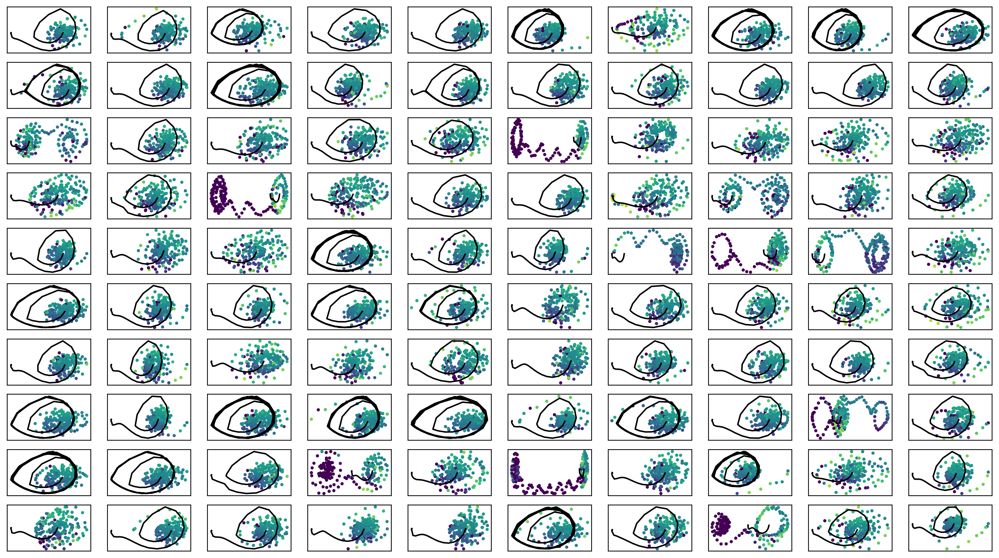

In [13]:

def f(x):
#     return x
    return np.log10(x)

fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter1.png")

In [14]:

train_curve1, valid_curve1 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()

# train_curve2, valid_curve2 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=2)
# iwvi.update_mulogvar_offlinedata()

# train_curve3, valid_curve3 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=3)
# iwvi.update_mulogvar_offlinedata()



weight_alpha 0.1
train_weighted_vae: enc_dec
train: iter 0  trainloss -395.83070  validloss -470.05054±0.00000  bestvalidloss -470.05054  last_update 0
train: iter 1  trainloss -385.64311  validloss -444.60686±0.00000  bestvalidloss -470.05054  last_update 1
train: iter 2  trainloss -396.82878  validloss -459.62711±0.00000  bestvalidloss -470.05054  last_update 2
train: iter 3  trainloss -398.53169  validloss -454.13265±0.00000  bestvalidloss -470.05054  last_update 3
train: iter 4  trainloss -390.78320  validloss -438.02635±0.00000  bestvalidloss -470.05054  last_update 4
train: iter 5  trainloss -400.55548  validloss -441.18306±0.00000  bestvalidloss -470.05054  last_update 5
train: iter 6  trainloss -395.71099  validloss -456.70922±0.00000  bestvalidloss -470.05054  last_update 6
train: iter 7  trainloss -399.18373  validloss -446.40199±0.00000  bestvalidloss -470.05054  last_update 7
train: iter 8  trainloss -396.80899  validloss -451.03552±0.00000  bestvalidloss -470.05054  last_u

train: iter 75  trainloss -401.37419  validloss -456.36019±0.00000  bestvalidloss -470.05054  last_update 75
train: iter 76  trainloss -396.89839  validloss -453.87490±0.00000  bestvalidloss -470.05054  last_update 76
train: iter 77  trainloss -391.64225  validloss -454.43464±0.00000  bestvalidloss -470.05054  last_update 77
train: iter 78  trainloss -380.49863  validloss -455.32355±0.00000  bestvalidloss -470.05054  last_update 78
train: iter 79  trainloss -398.51378  validloss -438.38270±0.00000  bestvalidloss -470.05054  last_update 79
train: iter 80  trainloss -391.83300  validloss -459.13907±0.00000  bestvalidloss -470.05054  last_update 80
train: iter 81  trainloss -396.95966  validloss -460.91433±0.00000  bestvalidloss -470.05054  last_update 81
train: iter 82  trainloss -400.52125  validloss -461.38991±0.00000  bestvalidloss -470.05054  last_update 82
train: iter 83  trainloss -391.66044  validloss -451.06002±0.00000  bestvalidloss -470.05054  last_update 83
train: iter 84  tra

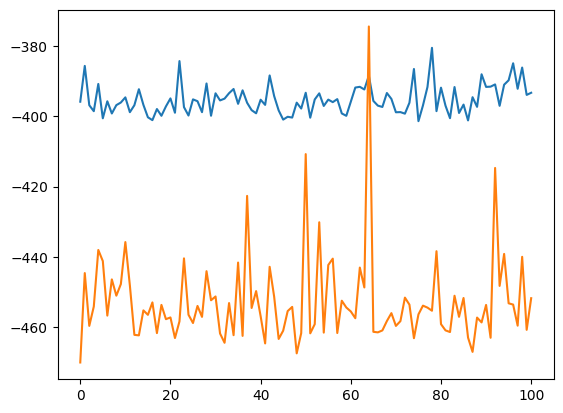

alpha 0.1 default_lr 0.0005


In [15]:
plt.plot(train_curve1)
plt.plot(valid_curve1)
plt.show()

# plt.plot(train_curve2)
# plt.plot(valid_curve2)
# plt.show()

# plt.plot(train_curve3)
# plt.plot(valid_curve3)
# plt.show()
print("alpha",alpha, "default_lr", default_lr)

In [16]:
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_data_fixlen()
# simdata0d = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_data_fixlen()
# simdata0e = copy.deepcopy(iwvi.simenv_rolloutdata)



0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56

実環境方策rollout vs Sim環境方策rollout


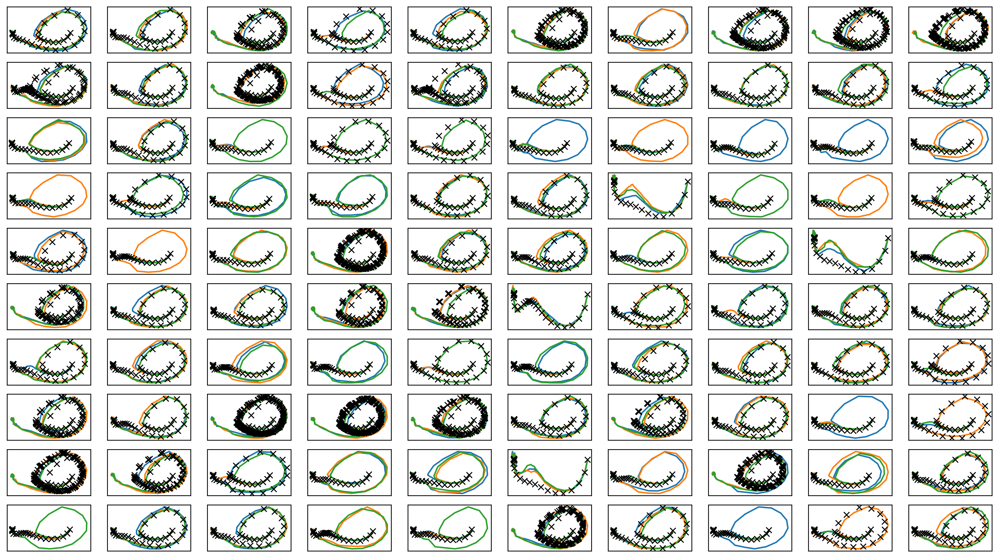

In [17]:
fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
    ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 
#     ax_list[-1].plot(simdata0d[i][:,0], simdata0d[i][:,1]) 
#     ax_list[-1].plot(simdata0e[i][:,0], simdata0e[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter1.png")
plt.savefig(figfilenamehead+"joint_iter1.eps")
# plt.savefig(figfilenamehead+"joint_iter1.pdf")
print("実環境方策rollout vs Sim環境方策rollout")

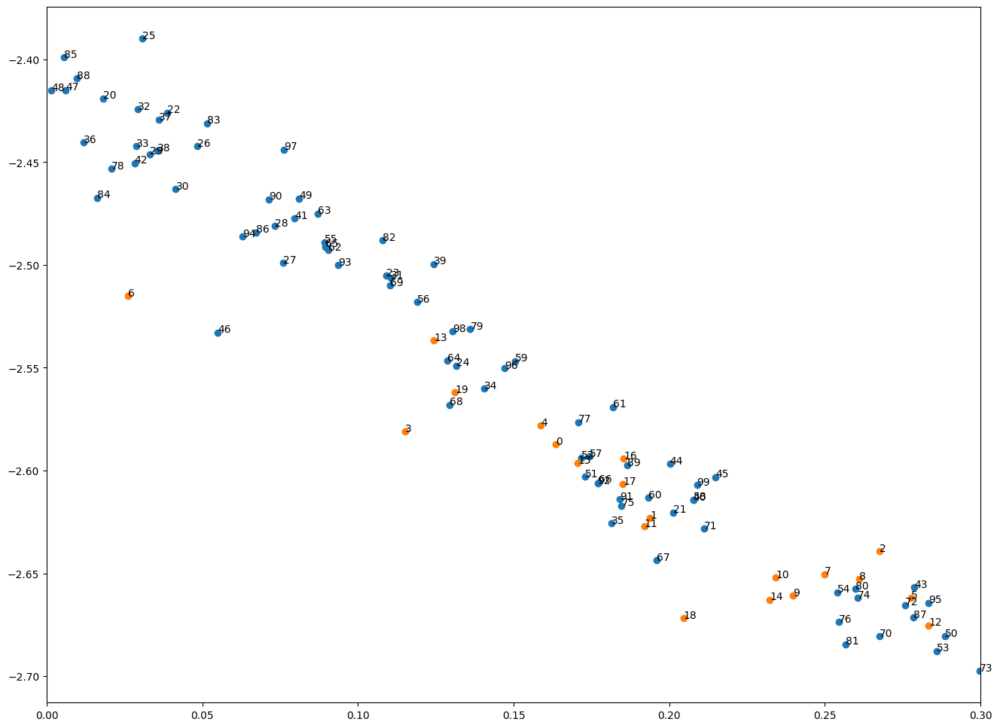

[0.16346495 0.19376823 0.2675319  0.11503246 0.15866848 0.27767899
 0.02613879 0.24978595 0.26100364 0.23974757]
[0.23415875 0.19197631 0.28340068 0.12439858 0.23227011 0.17053018
 0.18529065 0.1850802  0.20454609 0.13110959]
[0.01806764 0.20119136 0.03867789 0.10911323 0.13158045 0.03061344
 0.04839286 0.07598748 0.07332768 0.03311254]
[0.04145489 0.11061755 0.02913038 0.02882952 0.14059536 0.18145366
 0.01175634 0.03605897 0.03561832 0.1242789 ]
[0.20774164 0.07961685 0.02818215 0.27878886 0.20022311 0.21489816
 0.05495741 0.00603226 0.00140864 0.08100239]
[0.28865656 0.1728472  0.17167557 0.2858247  0.2539226  0.08923109
 0.11895172 0.17438186 0.20775948 0.15039731]
[0.19319706 0.18191796 0.09047245 0.08702328 0.12863061 0.0894847
 0.17726183 0.19596025 0.12942553 0.11026856]
[0.26757701 0.21116658 0.27584478 0.2996541  0.26043782 0.18466787
 0.25440247 0.17073022 0.0207501  0.1360628 ]
[0.2599147  0.256741   0.10799342 0.0514889  0.0163014  0.00555654
 0.06717741 0.27842439 0.00955

In [18]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter1.png")
plt.savefig(figfilenamehead+"damping_latent_iter1.eps")
# plt.savefig(figfilenamehead+"damping_latent_iter1.pdf")
plt.show()



for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [19]:
print(datetime.datetime.now())

2023-06-06 12:15:36.076989


# Iter2

In [20]:
iwvi.get_sim_rollout_mdppolicy_data_randomstop()

0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   


In [21]:
iwvi.train_ratio(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, policy=agent.select_action)


train: iter 0  trainloss 0.14638  validloss 0.13829±0.00000  bestvalidloss 0.13829  last_update 0
train: iter 1  trainloss 0.14441  validloss 0.13187±0.00000  bestvalidloss 0.13187  last_update 0
train: iter 2  trainloss 0.14385  validloss 0.13858±0.00000  bestvalidloss 0.13187  last_update 1
train: iter 3  trainloss 0.14491  validloss 0.13384±0.00000  bestvalidloss 0.13187  last_update 2
train: iter 4  trainloss 0.14231  validloss 0.13395±0.00000  bestvalidloss 0.13187  last_update 3
train: iter 5  trainloss 0.14198  validloss 0.13227±0.00000  bestvalidloss 0.13187  last_update 4
train: iter 6  trainloss 0.14115  validloss 0.13348±0.00000  bestvalidloss 0.13187  last_update 5
train: iter 7  trainloss 0.14148  validloss 0.13183±0.00000  bestvalidloss 0.13183  last_update 0
train: iter 8  trainloss 0.14277  validloss 0.13311±0.00000  bestvalidloss 0.13183  last_update 1
train: iter 9  trainloss 0.14277  validloss 0.13203±0.00000  bestvalidloss 0.13183  last_update 2
train: iter 10  trai

train: iter 83  trainloss 0.13783  validloss 0.12782±0.00000  bestvalidloss 0.12782  last_update 0
train: iter 84  trainloss 0.14046  validloss 0.13526±0.00000  bestvalidloss 0.12782  last_update 1
train: iter 85  trainloss 0.13848  validloss 0.12975±0.00000  bestvalidloss 0.12782  last_update 2
train: iter 86  trainloss 0.13989  validloss 0.13086±0.00000  bestvalidloss 0.12782  last_update 3
train: iter 87  trainloss 0.13998  validloss 0.13119±0.00000  bestvalidloss 0.12782  last_update 4
train: iter 88  trainloss 0.13787  validloss 0.13032±0.00000  bestvalidloss 0.12782  last_update 5
train: iter 89  trainloss 0.13633  validloss 0.12943±0.00000  bestvalidloss 0.12782  last_update 6
train: iter 90  trainloss 0.13728  validloss 0.13675±0.00000  bestvalidloss 0.12782  last_update 7
train: iter 91  trainloss 0.13717  validloss 0.13018±0.00000  bestvalidloss 0.12782  last_update 8
train: iter 92  trainloss 0.13948  validloss 0.12884±0.00000  bestvalidloss 0.12782  last_update 9
train: ite

train: iter 165  trainloss 0.13580  validloss 0.13140±0.00000  bestvalidloss 0.12728  last_update 19
train: iter 166  trainloss 0.13708  validloss 0.12902±0.00000  bestvalidloss 0.12728  last_update 20
train: iter 167  trainloss 0.13669  validloss 0.13111±0.00000  bestvalidloss 0.12728  last_update 21
train: iter 168  trainloss 0.13565  validloss 0.12683±0.00000  bestvalidloss 0.12683  last_update 0
train: iter 169  trainloss 0.13569  validloss 0.12806±0.00000  bestvalidloss 0.12683  last_update 1
train: iter 170  trainloss 0.13681  validloss 0.12811±0.00000  bestvalidloss 0.12683  last_update 2
train: iter 171  trainloss 0.13540  validloss 0.12949±0.00000  bestvalidloss 0.12683  last_update 3
train: iter 172  trainloss 0.13620  validloss 0.12763±0.00000  bestvalidloss 0.12683  last_update 4
train: iter 173  trainloss 0.13547  validloss 0.12850±0.00000  bestvalidloss 0.12683  last_update 5
train: iter 174  trainloss 0.13669  validloss 0.13603±0.00000  bestvalidloss 0.12683  last_update

train: iter 248  trainloss 0.13573  validloss 0.12740±0.00000  bestvalidloss 0.12649  last_update 34
train: iter 249  trainloss 0.13653  validloss 0.12841±0.00000  bestvalidloss 0.12649  last_update 35
train: iter 250  trainloss 0.13441  validloss 0.12835±0.00000  bestvalidloss 0.12649  last_update 36
train: iter 251  trainloss 0.13467  validloss 0.12719±0.00000  bestvalidloss 0.12649  last_update 37
train: iter 252  trainloss 0.13329  validloss 0.12895±0.00000  bestvalidloss 0.12649  last_update 38
train: iter 253  trainloss 0.13415  validloss 0.12609±0.00000  bestvalidloss 0.12609  last_update 0
train: iter 254  trainloss 0.13404  validloss 0.12727±0.00000  bestvalidloss 0.12609  last_update 1
train: iter 255  trainloss 0.13523  validloss 0.13714±0.00000  bestvalidloss 0.12609  last_update 2
train: iter 256  trainloss 0.13599  validloss 0.12942±0.00000  bestvalidloss 0.12609  last_update 3
train: iter 257  trainloss 0.13573  validloss 0.13024±0.00000  bestvalidloss 0.12609  last_upda

train: iter 330  trainloss 0.13328  validloss 0.12648±0.00000  bestvalidloss 0.12609  last_update 77
train: iter 331  trainloss 0.13547  validloss 0.12738±0.00000  bestvalidloss 0.12609  last_update 78
train: iter 332  trainloss 0.13348  validloss 0.12642±0.00000  bestvalidloss 0.12609  last_update 79
train: iter 333  trainloss 0.13301  validloss 0.13288±0.00000  bestvalidloss 0.12609  last_update 80
train: iter 334  trainloss 0.13338  validloss 0.12646±0.00000  bestvalidloss 0.12609  last_update 81
train: iter 335  trainloss 0.13214  validloss 0.12721±0.00000  bestvalidloss 0.12609  last_update 82
train: iter 336  trainloss 0.13267  validloss 0.13040±0.00000  bestvalidloss 0.12609  last_update 83
train: iter 337  trainloss 0.13397  validloss 0.13355±0.00000  bestvalidloss 0.12609  last_update 84
train: iter 338  trainloss 0.13409  validloss 0.13847±0.00000  bestvalidloss 0.12609  last_update 85
train: iter 339  trainloss 0.13373  validloss 0.13190±0.00000  bestvalidloss 0.12609  last_

train: iter 412  trainloss 0.13227  validloss 0.12620±0.00000  bestvalidloss 0.12608  last_update 62
train: iter 413  trainloss 0.13493  validloss 0.13055±0.00000  bestvalidloss 0.12608  last_update 63
train: iter 414  trainloss 0.13156  validloss 0.13019±0.00000  bestvalidloss 0.12608  last_update 64
train: iter 415  trainloss 0.13226  validloss 0.12532±0.00000  bestvalidloss 0.12532  last_update 0
train: iter 416  trainloss 0.13154  validloss 0.12746±0.00000  bestvalidloss 0.12532  last_update 1
train: iter 417  trainloss 0.13254  validloss 0.12748±0.00000  bestvalidloss 0.12532  last_update 2
train: iter 418  trainloss 0.13253  validloss 0.12563±0.00000  bestvalidloss 0.12532  last_update 3
train: iter 419  trainloss 0.13152  validloss 0.12774±0.00000  bestvalidloss 0.12532  last_update 4
train: iter 420  trainloss 0.13407  validloss 0.12684±0.00000  bestvalidloss 0.12532  last_update 5
train: iter 421  trainloss 0.13288  validloss 0.13494±0.00000  bestvalidloss 0.12532  last_update

train: iter 494  trainloss 0.13016  validloss 0.12694±0.00000  bestvalidloss 0.12485  last_update 40
train: iter 495  trainloss 0.13109  validloss 0.12807±0.00000  bestvalidloss 0.12485  last_update 41
train: iter 496  trainloss 0.12982  validloss 0.13208±0.00000  bestvalidloss 0.12485  last_update 42
train: iter 497  trainloss 0.13090  validloss 0.12887±0.00000  bestvalidloss 0.12485  last_update 43
train: iter 498  trainloss 0.13099  validloss 0.12637±0.00000  bestvalidloss 0.12485  last_update 44
train: iter 499  trainloss 0.13229  validloss 0.12781±0.00000  bestvalidloss 0.12485  last_update 45
train: iter 500  trainloss 0.13002  validloss 0.12779±0.00000  bestvalidloss 0.12485  last_update 46
train: iter 501  trainloss 0.13096  validloss 0.12852±0.00000  bestvalidloss 0.12485  last_update 47
train: iter 502  trainloss 0.13115  validloss 0.12730±0.00000  bestvalidloss 0.12485  last_update 48
train: iter 503  trainloss 0.13139  validloss 0.12803±0.00000  bestvalidloss 0.12485  last_

([0.1463847998995334,
  0.14440937493927777,
  0.14385495302267373,
  0.14490675562992691,
  0.1423101622145623,
  0.14198423796333373,
  0.14115303824655712,
  0.14148169732652605,
  0.14276873767375947,
  0.14277108260430396,
  0.14011006467044354,
  0.1412860850803554,
  0.14159886999987065,
  0.1417654998600483,
  0.14069545096717775,
  0.14146475484594703,
  0.13931035390123725,
  0.1397072718013078,
  0.14106543245725334,
  0.14087156830355524,
  0.1414485163986683,
  0.14244683212600648,
  0.1404689689632505,
  0.14049106887541712,
  0.140441925637424,
  0.1413835794199258,
  0.1411514517851174,
  0.14033113145269455,
  0.14216061173938216,
  0.14078260520473124,
  0.1407391450367868,
  0.1390789714641869,
  0.14192901649512352,
  0.140494513977319,
  0.1384387461002916,
  0.13978891186416148,
  0.13940189648419618,
  0.1401573823299259,
  0.1398991254158318,
  0.139514576876536,
  0.13884967197664083,
  0.13929122723639012,
  0.13906659707427024,
  0.13946606214158236,
  0.1389

In [22]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))
# print(loss_list)
# print(normalized_loss_list)

train_loss:  -0.7973119547918439
valid_loss:  -0.47868588176965715
weight_alpha 1.0 h_min_tilde -5.8423514 ell_tilde -0.7335867401874065 kappa_tilde 0.00044242743516713487
train_loss:  -1.9734686372071508
valid_loss:  -2.2615079399108886
weight_alpha 0.1 h_min_tilde -5.8423514 ell_tilde -2.031076497747898 kappa_tilde 0.0005122298231105738


1e-08 1000.0


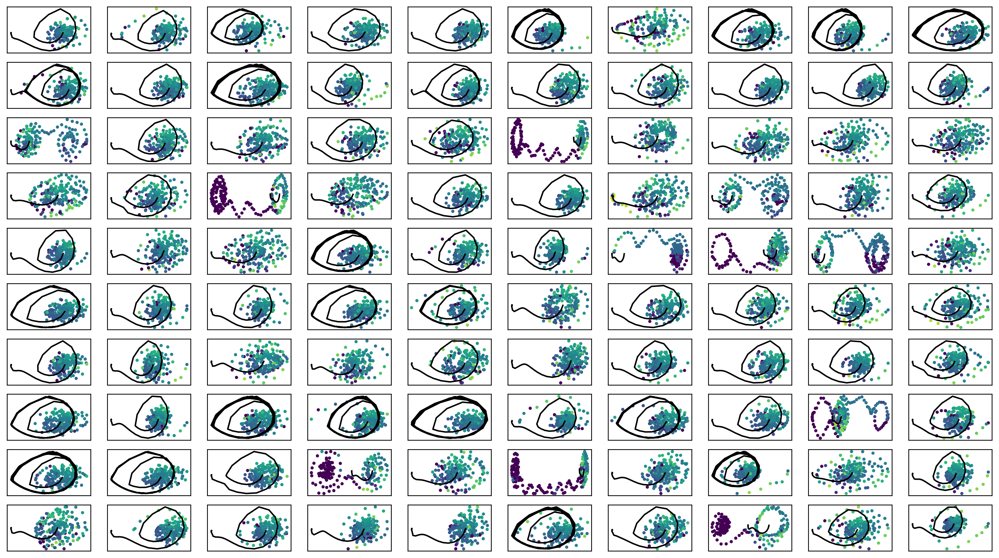

In [23]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter2.png")

In [24]:

train_curve1, valid_curve1 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()

# train_curve2, valid_curve2 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=2)
# iwvi.update_mulogvar_offlinedata()

# train_curve3, valid_curve3 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=3)
# iwvi.update_mulogvar_offlinedata()



weight_alpha 0.1
train_weighted_vae: enc_dec
train: iter 0  trainloss -376.81453  validloss -451.30596±0.00000  bestvalidloss -451.30596  last_update 0
train: iter 1  trainloss -385.22912  validloss -439.51940±0.00000  bestvalidloss -451.30596  last_update 1
train: iter 2  trainloss -384.27696  validloss -441.12962±0.00000  bestvalidloss -451.30596  last_update 2
train: iter 3  trainloss -384.26727  validloss -417.64980±0.00000  bestvalidloss -451.30596  last_update 3
train: iter 4  trainloss -372.09498  validloss -435.48779±0.00000  bestvalidloss -451.30596  last_update 4
train: iter 5  trainloss -380.95903  validloss -395.67132±0.00000  bestvalidloss -451.30596  last_update 5
train: iter 6  trainloss -386.31991  validloss -441.11391±0.00000  bestvalidloss -451.30596  last_update 6
train: iter 7  trainloss -385.83617  validloss -444.21675±0.00000  bestvalidloss -451.30596  last_update 7
train: iter 8  trainloss -388.42392  validloss -445.80934±0.00000  bestvalidloss -451.30596  last_u

train: iter 76  trainloss -385.33092  validloss -458.23041±0.00000  bestvalidloss -458.23041  last_update 0
train: iter 77  trainloss -374.15032  validloss -381.62496±0.00000  bestvalidloss -458.23041  last_update 1
train: iter 78  trainloss -380.84523  validloss -429.32828±0.00000  bestvalidloss -458.23041  last_update 2
train: iter 79  trainloss -383.78849  validloss -410.68844±0.00000  bestvalidloss -458.23041  last_update 3
train: iter 80  trainloss -376.32476  validloss -443.53568±0.00000  bestvalidloss -458.23041  last_update 4
train: iter 81  trainloss -383.05698  validloss -440.88027±0.00000  bestvalidloss -458.23041  last_update 5
train: iter 82  trainloss -377.54237  validloss -426.30178±0.00000  bestvalidloss -458.23041  last_update 6
train: iter 83  trainloss -385.72636  validloss -428.32705±0.00000  bestvalidloss -458.23041  last_update 7
train: iter 84  trainloss -383.65865  validloss -439.48970±0.00000  bestvalidloss -458.23041  last_update 8
train: iter 85  trainloss -3

train: iter 151  trainloss -374.58438  validloss -408.80080±0.00000  bestvalidloss -458.23041  last_update 75
train: iter 152  trainloss -380.25080  validloss -445.48777±0.00000  bestvalidloss -458.23041  last_update 76
train: iter 153  trainloss -376.57266  validloss -414.07088±0.00000  bestvalidloss -458.23041  last_update 77
train: iter 154  trainloss -377.21236  validloss -440.60663±0.00000  bestvalidloss -458.23041  last_update 78
train: iter 155  trainloss -381.05832  validloss -441.63457±0.00000  bestvalidloss -458.23041  last_update 79
train: iter 156  trainloss -377.44215  validloss -447.32251±0.00000  bestvalidloss -458.23041  last_update 80
train: iter 157  trainloss -384.87712  validloss -444.19740±0.00000  bestvalidloss -458.23041  last_update 81
train: iter 158  trainloss -374.62187  validloss -440.62946±0.00000  bestvalidloss -458.23041  last_update 82
train: iter 159  trainloss -382.43292  validloss -449.77227±0.00000  bestvalidloss -458.23041  last_update 83
train: ite

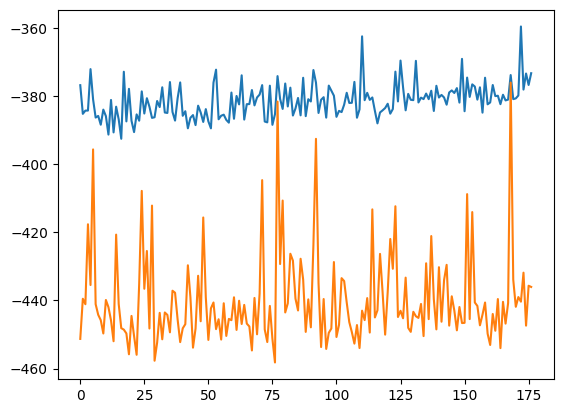

alpha 0.1 default_lr 0.0005


In [25]:
plt.plot(train_curve1)
plt.plot(valid_curve1)
plt.show()

# plt.plot(train_curve2)
# plt.plot(valid_curve2)
# plt.show()

# plt.plot(train_curve3)
# plt.plot(valid_curve3)
# plt.show()
print("alpha",alpha, "default_lr", default_lr)

In [26]:
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)



0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56

実環境方策rollout vs Sim環境方策rollout


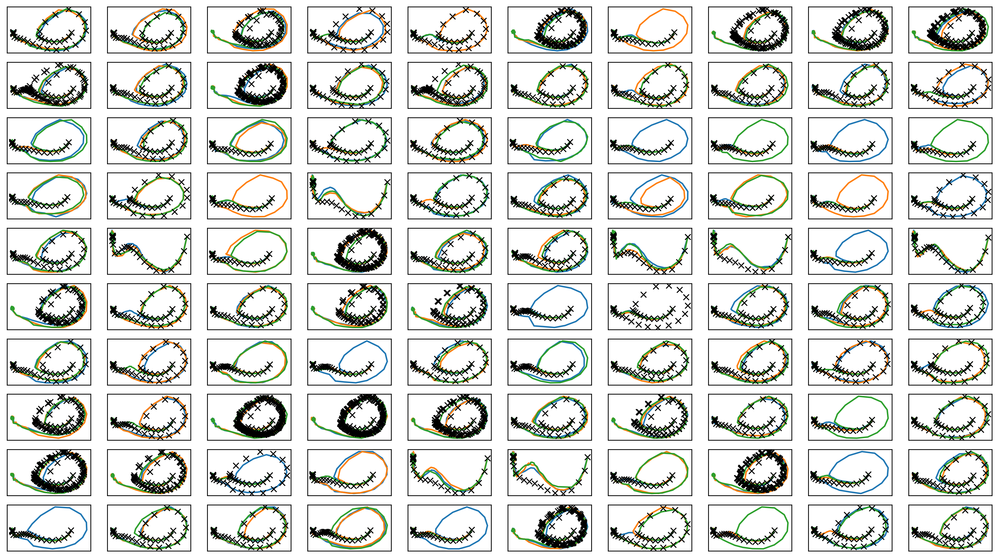

In [27]:
fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
    ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 
#     ax_list[-1].plot(simdata0d[i][:,0], simdata0d[i][:,1]) 
#     ax_list[-1].plot(simdata0e[i][:,0], simdata0e[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter2.png")
plt.savefig(figfilenamehead+"joint_iter2.eps")
# plt.savefig(figfilenamehead+"joint_iter2.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

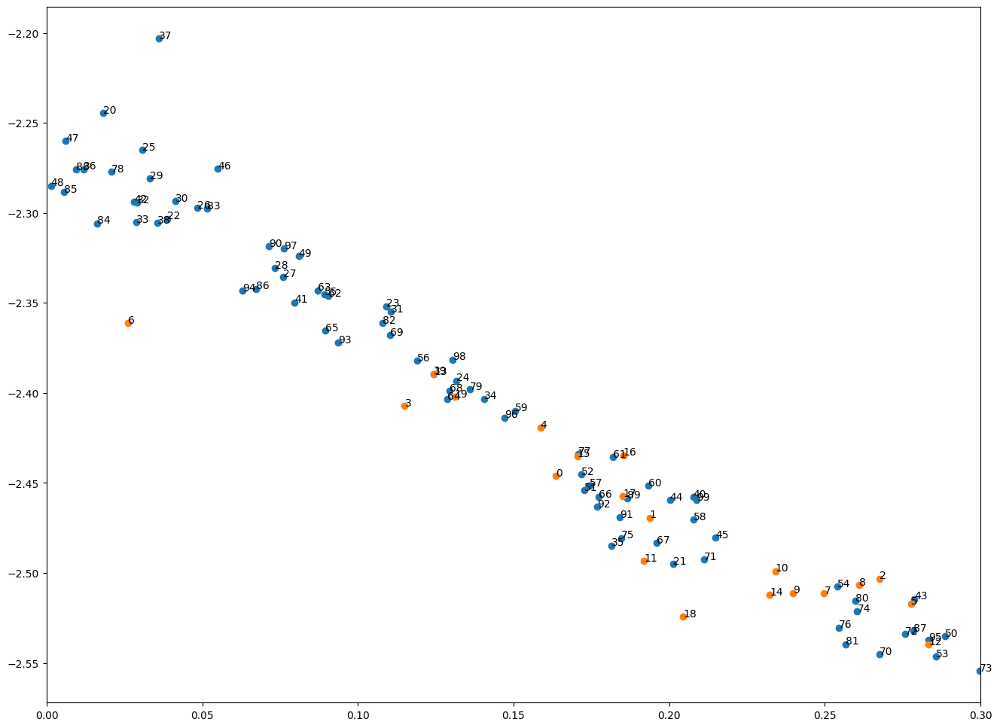

[0.16346495 0.19376823 0.2675319  0.11503246 0.15866848 0.27767899
 0.02613879 0.24978595 0.26100364 0.23974757]
[0.23415875 0.19197631 0.28340068 0.12439858 0.23227011 0.17053018
 0.18529065 0.1850802  0.20454609 0.13110959]
[0.01806764 0.20119136 0.03867789 0.10911323 0.13158045 0.03061344
 0.04839286 0.07598748 0.07332768 0.03311254]
[0.04145489 0.11061755 0.02913038 0.02882952 0.14059536 0.18145366
 0.01175634 0.03605897 0.03561832 0.1242789 ]
[0.20774164 0.07961685 0.02818215 0.27878886 0.20022311 0.21489816
 0.05495741 0.00603226 0.00140864 0.08100239]
[0.28865656 0.1728472  0.17167557 0.2858247  0.2539226  0.08923109
 0.11895172 0.17438186 0.20775948 0.15039731]
[0.19319706 0.18191796 0.09047245 0.08702328 0.12863061 0.0894847
 0.17726183 0.19596025 0.12942553 0.11026856]
[0.26757701 0.21116658 0.27584478 0.2996541  0.26043782 0.18466787
 0.25440247 0.17073022 0.0207501  0.1360628 ]
[0.2599147  0.256741   0.10799342 0.0514889  0.0163014  0.00555654
 0.06717741 0.27842439 0.00955

In [28]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter2.png")
plt.savefig(figfilenamehead+"damping_latent_iter2.eps")
# plt.savefig(figfilenamehead+"damping_latent_iter2.pdf")
plt.show()



for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [29]:
print(datetime.datetime.now())

2023-06-06 12:19:06.793512


# Iter 3

In [30]:
iwvi.get_sim_rollout_mdppolicy_data_randomstop()

0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   


In [31]:
iwvi.train_ratio(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, policy=agent.select_action)


train: iter 0  trainloss 0.13621  validloss 0.13261±0.00000  bestvalidloss 0.13261  last_update 0
train: iter 1  trainloss 0.13089  validloss 0.11809±0.00000  bestvalidloss 0.11809  last_update 0
train: iter 2  trainloss 0.12980  validloss 0.12001±0.00000  bestvalidloss 0.11809  last_update 1
train: iter 3  trainloss 0.12886  validloss 0.12358±0.00000  bestvalidloss 0.11809  last_update 2
train: iter 4  trainloss 0.12968  validloss 0.11793±0.00000  bestvalidloss 0.11793  last_update 0
train: iter 5  trainloss 0.12734  validloss 0.12095±0.00000  bestvalidloss 0.11793  last_update 1
train: iter 6  trainloss 0.12786  validloss 0.12164±0.00000  bestvalidloss 0.11793  last_update 2
train: iter 7  trainloss 0.12805  validloss 0.11608±0.00000  bestvalidloss 0.11608  last_update 0
train: iter 8  trainloss 0.12987  validloss 0.12027±0.00000  bestvalidloss 0.11608  last_update 1
train: iter 9  trainloss 0.12808  validloss 0.11987±0.00000  bestvalidloss 0.11608  last_update 2
train: iter 10  trai

train: iter 84  trainloss 0.12403  validloss 0.11634±0.00000  bestvalidloss 0.11363  last_update 45
train: iter 85  trainloss 0.12581  validloss 0.11448±0.00000  bestvalidloss 0.11363  last_update 46
train: iter 86  trainloss 0.12363  validloss 0.11790±0.00000  bestvalidloss 0.11363  last_update 47
train: iter 87  trainloss 0.12372  validloss 0.11620±0.00000  bestvalidloss 0.11363  last_update 48
train: iter 88  trainloss 0.12482  validloss 0.11726±0.00000  bestvalidloss 0.11363  last_update 49
train: iter 89  trainloss 0.12459  validloss 0.11449±0.00000  bestvalidloss 0.11363  last_update 50
train: iter 90  trainloss 0.12444  validloss 0.11589±0.00000  bestvalidloss 0.11363  last_update 51
train: iter 91  trainloss 0.12384  validloss 0.11832±0.00000  bestvalidloss 0.11363  last_update 52
train: iter 92  trainloss 0.12274  validloss 0.12420±0.00000  bestvalidloss 0.11363  last_update 53
train: iter 93  trainloss 0.12247  validloss 0.11442±0.00000  bestvalidloss 0.11363  last_update 54


([0.13621354601345956,
  0.1308941318653524,
  0.12979905921965837,
  0.1288616773672402,
  0.1296753329690546,
  0.12734475028701125,
  0.12786353761330246,
  0.12804814344272017,
  0.1298682861495763,
  0.12807679115794599,
  0.12751745879650117,
  0.12761641279794275,
  0.12740079164505005,
  0.12986664958298205,
  0.12782870875671506,
  0.1283719392027706,
  0.12661527162417768,
  0.12641859469003974,
  0.12479206705465913,
  0.1264554144348949,
  0.12816418637521565,
  0.12730954466387628,
  0.12618420207872988,
  0.12632062323391438,
  0.12612406206317245,
  0.1255910935346037,
  0.1267896953970194,
  0.12607284276746214,
  0.12710843202657998,
  0.12495683431625366,
  0.12752365646883845,
  0.13108662045560776,
  0.1270667698699981,
  0.12509585153311492,
  0.12774862311780452,
  0.12513255132362247,
  0.12490385095588863,
  0.125271554896608,
  0.12560208099894227,
  0.12545355418697,
  0.12582210171967745,
  0.12458136645145715,
  0.12509605861268938,
  0.12526831175200642,
  

In [32]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))
# print(loss_list)
# print(normalized_loss_list)

train_loss:  -0.9481301544874906
valid_loss:  -0.6180028380155563
weight_alpha 1.0 h_min_tilde -5.874338 ell_tilde -0.8821046911931038 kappa_tilde 0.0004475613309377407
train_loss:  -2.164313190963864
valid_loss:  -2.4825576599121093
weight_alpha 0.1 h_min_tilde -5.874338 ell_tilde -2.227962084753513 kappa_tilde 0.00052368395927269


1e-08 1000.0


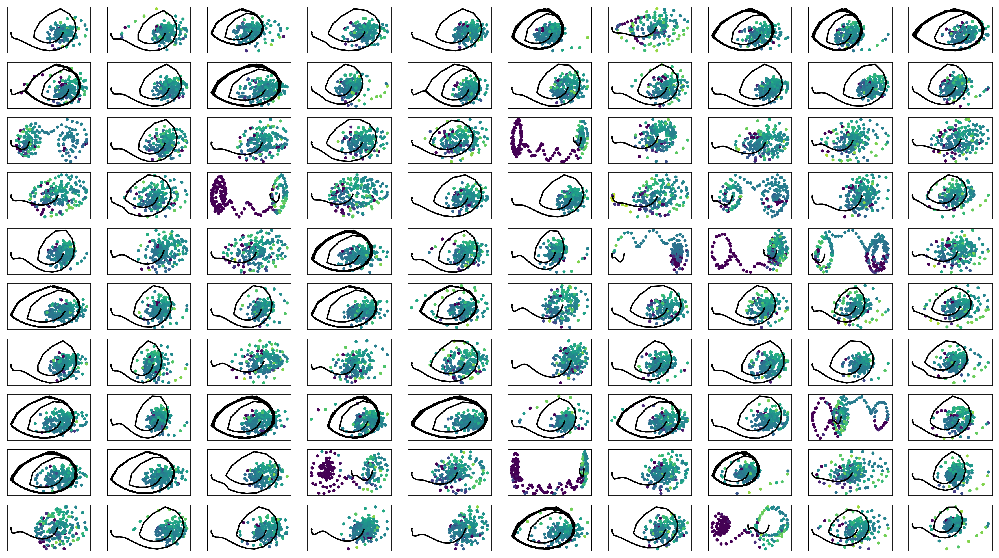

In [33]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter3.png")

In [34]:

train_curve1, valid_curve1 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()

# train_curve2, valid_curve2 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=2)
# iwvi.update_mulogvar_offlinedata()

# train_curve3, valid_curve3 = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, weight_alpha=alpha, flag=3)
# iwvi.update_mulogvar_offlinedata()



weight_alpha 0.1
train_weighted_vae: enc_dec
train: iter 0  trainloss -428.02192  validloss -494.23782±0.00000  bestvalidloss -494.23782  last_update 0
train: iter 1  trainloss -433.74017  validloss -475.51337±0.00000  bestvalidloss -494.23782  last_update 1
train: iter 2  trainloss -422.23139  validloss -497.55245±0.00000  bestvalidloss -497.55245  last_update 0
train: iter 3  trainloss -425.28974  validloss -465.41754±0.00000  bestvalidloss -497.55245  last_update 1
train: iter 4  trainloss -428.23802  validloss -478.01891±0.00000  bestvalidloss -497.55245  last_update 2
train: iter 5  trainloss -425.08626  validloss -497.00322±0.00000  bestvalidloss -497.55245  last_update 3
train: iter 6  trainloss -427.64873  validloss -502.42410±0.00000  bestvalidloss -502.42410  last_update 0
train: iter 7  trainloss -428.74756  validloss -452.92052±0.00000  bestvalidloss -502.42410  last_update 1
train: iter 8  trainloss -427.74505  validloss -497.53769±0.00000  bestvalidloss -502.42410  last_u

train: iter 76  trainloss -419.00128  validloss -493.87242±0.00000  bestvalidloss -504.82407  last_update 48
train: iter 77  trainloss -427.05565  validloss -498.61646±0.00000  bestvalidloss -504.82407  last_update 49
train: iter 78  trainloss -408.91433  validloss -471.25028±0.00000  bestvalidloss -504.82407  last_update 50
train: iter 79  trainloss -418.79310  validloss -499.29238±0.00000  bestvalidloss -504.82407  last_update 51
train: iter 80  trainloss -427.85294  validloss -494.01300±0.00000  bestvalidloss -504.82407  last_update 52
train: iter 81  trainloss -423.25544  validloss -491.26453±0.00000  bestvalidloss -504.82407  last_update 53
train: iter 82  trainloss -423.58190  validloss -473.35134±0.00000  bestvalidloss -504.82407  last_update 54
train: iter 83  trainloss -420.40003  validloss -489.91691±0.00000  bestvalidloss -504.82407  last_update 55
train: iter 84  trainloss -423.04563  validloss -463.81920±0.00000  bestvalidloss -504.82407  last_update 56
train: iter 85  tra

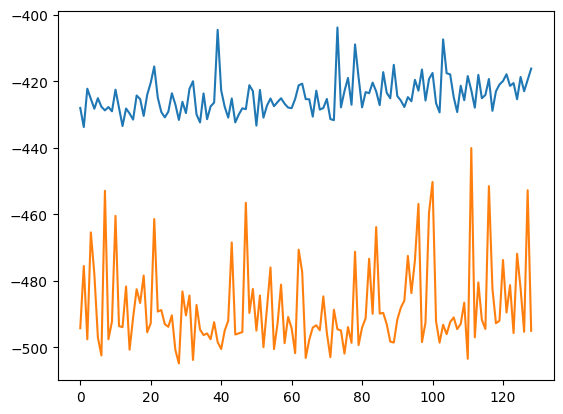

alpha 0.1 default_lr 0.0005


In [35]:
plt.plot(train_curve1)
plt.plot(valid_curve1)
plt.show()

# plt.plot(train_curve2)
# plt.plot(valid_curve2)
# plt.show()

# plt.plot(train_curve3)
# plt.plot(valid_curve3)
# plt.show()
print("alpha",alpha, "default_lr", default_lr)

In [36]:
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_mdppolicy_data_fixlen()
simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)


0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   
0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56

実環境方策rollout vs Sim環境方策rollout


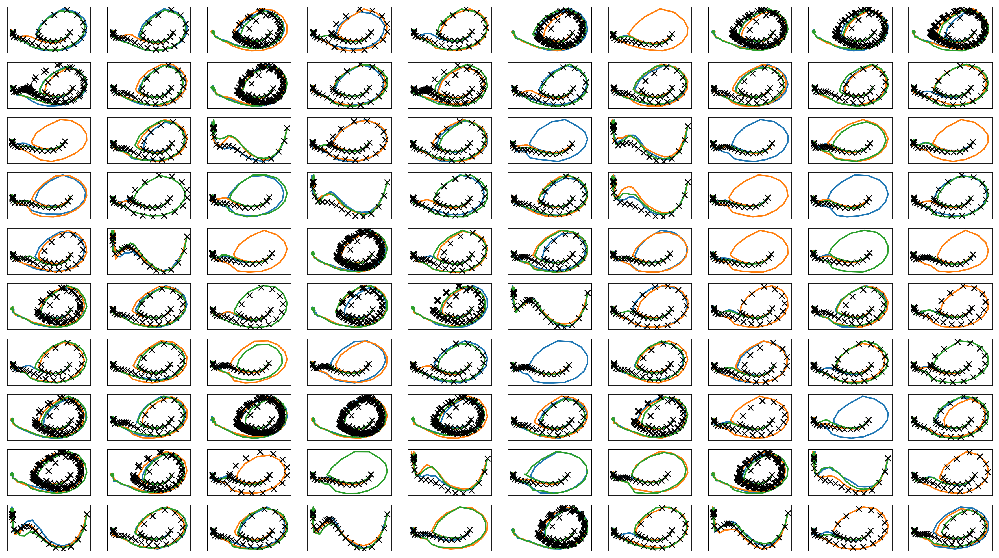

In [37]:

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
    ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 
#     ax_list[-1].plot(simdata0d[i][:,0], simdata0d[i][:,1]) 
#     ax_list[-1].plot(simdata0e[i][:,0], simdata0e[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter3.png")
plt.savefig(figfilenamehead+"joint_iter3.eps")
# plt.savefig(figfilenamehead+"joint_iter3.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

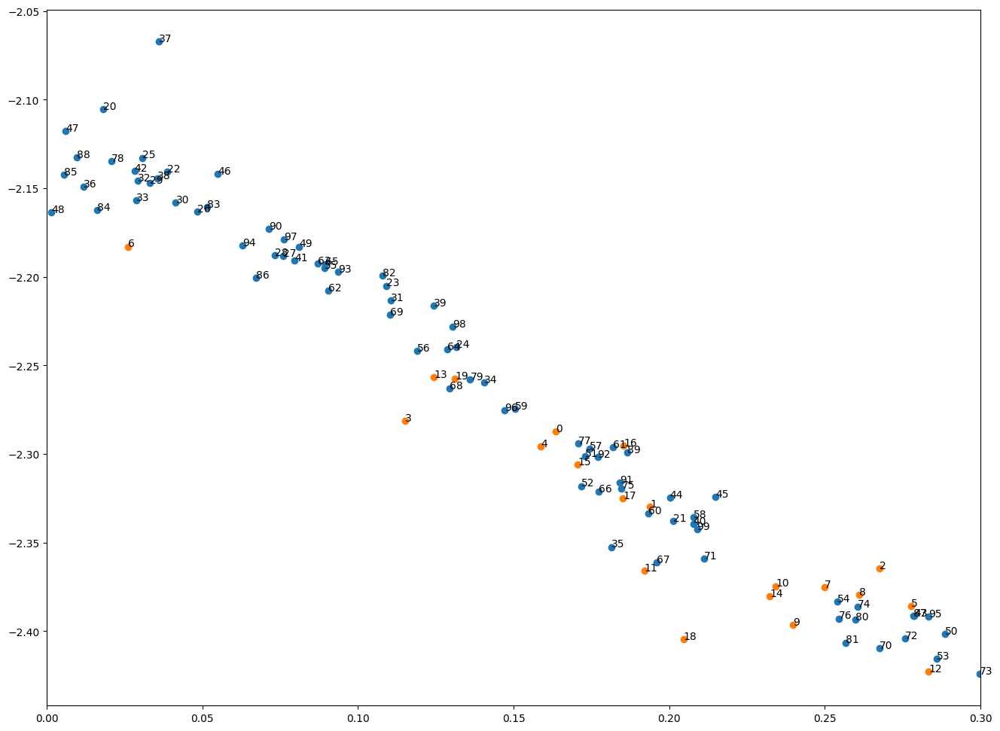

[0.16346495 0.19376823 0.2675319  0.11503246 0.15866848 0.27767899
 0.02613879 0.24978595 0.26100364 0.23974757]
[0.23415875 0.19197631 0.28340068 0.12439858 0.23227011 0.17053018
 0.18529065 0.1850802  0.20454609 0.13110959]
[0.01806764 0.20119136 0.03867789 0.10911323 0.13158045 0.03061344
 0.04839286 0.07598748 0.07332768 0.03311254]
[0.04145489 0.11061755 0.02913038 0.02882952 0.14059536 0.18145366
 0.01175634 0.03605897 0.03561832 0.1242789 ]
[0.20774164 0.07961685 0.02818215 0.27878886 0.20022311 0.21489816
 0.05495741 0.00603226 0.00140864 0.08100239]
[0.28865656 0.1728472  0.17167557 0.2858247  0.2539226  0.08923109
 0.11895172 0.17438186 0.20775948 0.15039731]
[0.19319706 0.18191796 0.09047245 0.08702328 0.12863061 0.0894847
 0.17726183 0.19596025 0.12942553 0.11026856]
[0.26757701 0.21116658 0.27584478 0.2996541  0.26043782 0.18466787
 0.25440247 0.17073022 0.0207501  0.1360628 ]
[0.2599147  0.256741   0.10799342 0.0514889  0.0163014  0.00555654
 0.06717741 0.27842439 0.00955

In [38]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter3.png")
plt.savefig(figfilenamehead+"damping_latent_iter3.eps")
# plt.savefig(figfilenamehead+"damping_latent_iter3.pdf")
plt.show()



for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [39]:
print(datetime.datetime.now())

2023-06-06 12:20:51.510495


# 評価関数計算

In [40]:
iwvi.get_sim_rollout_mdppolicy_data_randomstop()

0  1  2  3  4  5  6  7  8  9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99   


In [41]:
iwvi.train_ratio(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early, policy=agent.select_action)
# iwvi.save()
# plt.plot(train_curve)
# plt.plot(valid_curve)

train: iter 0  trainloss 0.13321  validloss 0.12833±0.00000  bestvalidloss 0.12833  last_update 0
train: iter 1  trainloss 0.12977  validloss 0.11351±0.00000  bestvalidloss 0.11351  last_update 0
train: iter 2  trainloss 0.12895  validloss 0.11531±0.00000  bestvalidloss 0.11351  last_update 1
train: iter 3  trainloss 0.12878  validloss 0.11980±0.00000  bestvalidloss 0.11351  last_update 2
train: iter 4  trainloss 0.12968  validloss 0.12260±0.00000  bestvalidloss 0.11351  last_update 3
train: iter 5  trainloss 0.12828  validloss 0.12233±0.00000  bestvalidloss 0.11351  last_update 4
train: iter 6  trainloss 0.12801  validloss 0.12013±0.00000  bestvalidloss 0.11351  last_update 5
train: iter 7  trainloss 0.12957  validloss 0.12791±0.00000  bestvalidloss 0.11351  last_update 6
train: iter 8  trainloss 0.12707  validloss 0.11763±0.00000  bestvalidloss 0.11351  last_update 7
train: iter 9  trainloss 0.12659  validloss 0.11736±0.00000  bestvalidloss 0.11351  last_update 8
train: iter 10  trai

train: iter 83  trainloss 0.12393  validloss 0.11689±0.00000  bestvalidloss 0.11291  last_update 8
train: iter 84  trainloss 0.12352  validloss 0.11627±0.00000  bestvalidloss 0.11291  last_update 9
train: iter 85  trainloss 0.12503  validloss 0.11992±0.00000  bestvalidloss 0.11291  last_update 10
train: iter 86  trainloss 0.12435  validloss 0.11469±0.00000  bestvalidloss 0.11291  last_update 11
train: iter 87  trainloss 0.12614  validloss 0.11906±0.00000  bestvalidloss 0.11291  last_update 12
train: iter 88  trainloss 0.12414  validloss 0.11634±0.00000  bestvalidloss 0.11291  last_update 13
train: iter 89  trainloss 0.12440  validloss 0.11451±0.00000  bestvalidloss 0.11291  last_update 14
train: iter 90  trainloss 0.12364  validloss 0.11982±0.00000  bestvalidloss 0.11291  last_update 15
train: iter 91  trainloss 0.12584  validloss 0.11560±0.00000  bestvalidloss 0.11291  last_update 16
train: iter 92  trainloss 0.12476  validloss 0.11625±0.00000  bestvalidloss 0.11291  last_update 17
tr

train: iter 165  trainloss 0.12403  validloss 0.12282±0.00000  bestvalidloss 0.11288  last_update 32
train: iter 166  trainloss 0.12428  validloss 0.12708±0.00000  bestvalidloss 0.11288  last_update 33
train: iter 167  trainloss 0.12262  validloss 0.11539±0.00000  bestvalidloss 0.11288  last_update 34
train: iter 168  trainloss 0.12337  validloss 0.11555±0.00000  bestvalidloss 0.11288  last_update 35
train: iter 169  trainloss 0.12345  validloss 0.11704±0.00000  bestvalidloss 0.11288  last_update 36
train: iter 170  trainloss 0.12261  validloss 0.11464±0.00000  bestvalidloss 0.11288  last_update 37
train: iter 171  trainloss 0.12524  validloss 0.11591±0.00000  bestvalidloss 0.11288  last_update 38
train: iter 172  trainloss 0.12299  validloss 0.11530±0.00000  bestvalidloss 0.11288  last_update 39
train: iter 173  trainloss 0.12285  validloss 0.11425±0.00000  bestvalidloss 0.11288  last_update 40
train: iter 174  trainloss 0.12401  validloss 0.12697±0.00000  bestvalidloss 0.11288  last_

([0.13320831209421158,
  0.12976746754720808,
  0.12895194129087031,
  0.12878023916855455,
  0.12968277609907092,
  0.128281806409359,
  0.12801241003908218,
  0.12957123829983175,
  0.1270736599806696,
  0.12658627135679126,
  0.12786122118122875,
  0.12832217742688953,
  0.12992943809367716,
  0.12757149818353355,
  0.12682823538780214,
  0.12704110508784652,
  0.12679078984074293,
  0.12806848478503524,
  0.1280573050957173,
  0.12584603284485638,
  0.12824877076782287,
  0.12545111030340195,
  0.1260496551170945,
  0.12626189580187203,
  0.12664525937289,
  0.127716335747391,
  0.12703331145457925,
  0.12631059158593416,
  0.12680635801516474,
  0.1254140808712691,
  0.12603614828549325,
  0.12650118651799858,
  0.1263072696980089,
  0.12486539008095861,
  0.1269071048591286,
  0.1260390122421086,
  0.1260219996329397,
  0.12834058916196228,
  0.12553834351710974,
  0.12485847012139857,
  0.12808879250660538,
  0.12700161286629735,
  0.12579134171828626,
  0.12721353028900922,
  0

In [42]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))
print(loss_list)
print(normalized_loss_list)

train_loss:  -0.6127064611598849
valid_loss:  -0.3271405048489571
weight_alpha 1.0 h_min_tilde -5.804922 ell_tilde -0.5555932698976993 kappa_tilde 0.00043646368037221907
train_loss:  -1.9605466712594026
valid_loss:  -2.214238175201416
weight_alpha 0.1 h_min_tilde -5.804922 ell_tilde -2.011284972047805 kappa_tilde 0.0005134192006947039
[(-0.5483260105699301, -0.356260113286972), (-0.7973119547918439, -0.47868588176965715), (-0.9481301544874906, -0.6180028380155563), (-0.6127064611598849, -0.3271405048489571)]
[(-1.987668114733696, -2.3517201507568357), (-1.9734686372071508, -2.2615079399108886), (-2.164313190963864, -2.4825576599121093), (-1.9605466712594026, -2.214238175201416)]


In [43]:
train_curve, valid_curve = iwvi.train_initial_belief(num_iter=100000, lr=1e-3, early_stop_step=default_early)


train: iter 0  trainloss 2.50050  validloss 1.47975±0.00000  bestvalidloss 1.47975  last_update 0
train: iter 1  trainloss 1.00217  validloss 0.19301±0.00000  bestvalidloss 0.19301  last_update 0
train: iter 2  trainloss 0.21653  validloss -0.49962±0.00000  bestvalidloss -0.49962  last_update 0
train: iter 3  trainloss -0.27431  validloss -0.82341±0.00000  bestvalidloss -0.82341  last_update 0
train: iter 4  trainloss -0.50359  validloss -0.99650±0.00000  bestvalidloss -0.99650  last_update 0
train: iter 5  trainloss -0.72087  validloss -1.04806±0.00000  bestvalidloss -1.04806  last_update 0
train: iter 6  trainloss -0.80997  validloss -1.01542±0.00000  bestvalidloss -1.04806  last_update 1
train: iter 7  trainloss -0.84375  validloss -0.94197±0.00000  bestvalidloss -1.04806  last_update 2
train: iter 8  trainloss -0.86877  validloss -0.94888±0.00000  bestvalidloss -1.04806  last_update 3
train: iter 9  trainloss -0.82989  validloss -0.89811±0.00000  bestvalidloss -1.04806  last_update

train: iter 88  trainloss -0.94268  validloss -0.87687±0.00000  bestvalidloss -1.04806  last_update 83
train: iter 89  trainloss -0.91543  validloss -0.84819±0.00000  bestvalidloss -1.04806  last_update 84
train: iter 90  trainloss -0.89346  validloss -0.88641±0.00000  bestvalidloss -1.04806  last_update 85
train: iter 91  trainloss -0.91492  validloss -0.87256±0.00000  bestvalidloss -1.04806  last_update 86
train: iter 92  trainloss -0.95581  validloss -0.90786±0.00000  bestvalidloss -1.04806  last_update 87
train: iter 93  trainloss -0.92989  validloss -0.88526±0.00000  bestvalidloss -1.04806  last_update 88
train: iter 94  trainloss -0.92804  validloss -0.95406±0.00000  bestvalidloss -1.04806  last_update 89
train: iter 95  trainloss -0.90730  validloss -0.81182±0.00000  bestvalidloss -1.04806  last_update 90
train: iter 96  trainloss -0.93899  validloss -0.88727±0.00000  bestvalidloss -1.04806  last_update 91
train: iter 97  trainloss -0.89900  validloss -0.90814±0.00000  bestvalid

In [44]:
print(iwvi.initial_belief)


Parameter containing:
tensor([-2.2534, -4.6617], requires_grad=True)


In [45]:
train_curve, valid_curve = iwvi.train_penalty(num_iter=num_iter_max, lr=default_lr, early_stop_step=default_early)

train: iter 0  trainloss 4.50103  validloss 20.79265±0.00000  bestvalidloss 20.79265  last_update 0
train: iter 1  trainloss 2.21951  validloss 1.12708±0.00000  bestvalidloss 1.12708  last_update 0
train: iter 2  trainloss 2.29198  validloss 1.15732±0.00000  bestvalidloss 1.12708  last_update 1
train: iter 3  trainloss 2.22740  validloss 1.26681±0.00000  bestvalidloss 1.12708  last_update 2
train: iter 4  trainloss 2.18530  validloss 1.20613±0.00000  bestvalidloss 1.12708  last_update 3
train: iter 5  trainloss 2.20860  validloss 1.19855±0.00000  bestvalidloss 1.12708  last_update 4
train: iter 6  trainloss 2.21602  validloss 1.18461±0.00000  bestvalidloss 1.12708  last_update 5
train: iter 7  trainloss 2.18973  validloss 1.25806±0.00000  bestvalidloss 1.12708  last_update 6
train: iter 8  trainloss 2.22651  validloss 1.18856±0.00000  bestvalidloss 1.12708  last_update 7
train: iter 9  trainloss 2.18091  validloss 1.27931±0.00000  bestvalidloss 1.12708  last_update 8
train: iter 10  tr

train: iter 83  trainloss 2.24138  validloss 1.18621±0.00000  bestvalidloss 1.09199  last_update 63
train: iter 84  trainloss 2.18007  validloss 1.12003±0.00000  bestvalidloss 1.09199  last_update 64
train: iter 85  trainloss 2.14258  validloss 1.16234±0.00000  bestvalidloss 1.09199  last_update 65
train: iter 86  trainloss 2.14804  validloss 1.25850±0.00000  bestvalidloss 1.09199  last_update 66
train: iter 87  trainloss 2.18735  validloss 1.18860±0.00000  bestvalidloss 1.09199  last_update 67
train: iter 88  trainloss 2.24054  validloss 1.18835±0.00000  bestvalidloss 1.09199  last_update 68
train: iter 89  trainloss 2.39565  validloss 1.36732±0.00000  bestvalidloss 1.09199  last_update 69
train: iter 90  trainloss 2.19234  validloss 1.23026±0.00000  bestvalidloss 1.09199  last_update 70
train: iter 91  trainloss 2.26301  validloss 1.22774±0.00000  bestvalidloss 1.09199  last_update 71
train: iter 92  trainloss 2.17673  validloss 1.17334±0.00000  bestvalidloss 1.09199  last_update 72


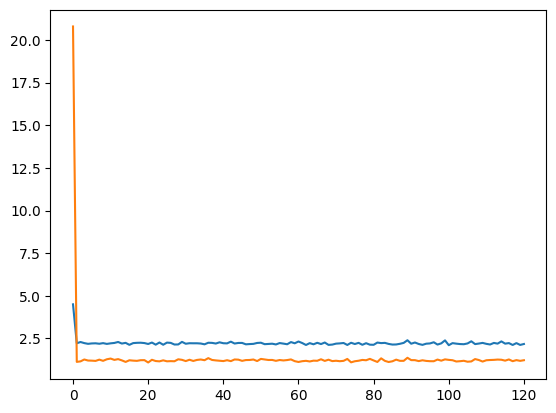

In [46]:
plt.plot(train_curve)
plt.plot(valid_curve)

In [47]:
iwvi.save(ckpt_key="policy_evaluation")

iwvi save ckpt1, ckpt2 ckpt_iwvi_basepartpendulum_policy_evaluation ckpt_iwvi_pendulum_policy_evaluation
base save ckpt ckpt_basevi_pendulum_policy_evaluation
base load self.initial_belief.data.sum() tensor(-6.9151)
base load dec.state_dict()['net_phat.0.weight'].sum() tensor(1.1789)


In [48]:
loss_array = np.array(loss_list)
print(loss_array)

[[-0.54832601 -0.35626011]
 [-0.79731195 -0.47868588]
 [-0.94813015 -0.61800284]
 [-0.61270646 -0.3271405 ]]


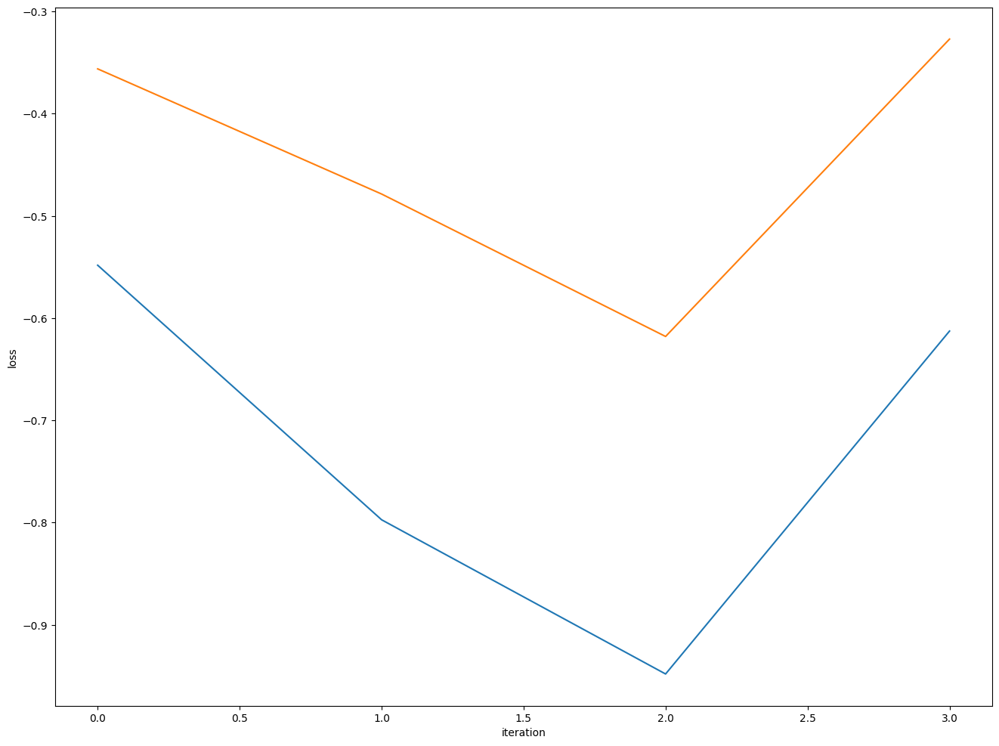

In [49]:
plt.figure(figsize=(16,12))
plt.plot(loss_array[:,0])
plt.plot(loss_array[:,1])
plt.xlabel("iteration")
plt.ylabel("loss")
plt.savefig(figfilenamehead+"learning_curve.png")
plt.savefig(figfilenamehead+"learning_curve.eps")
# plt.savefig(figfilenamehead+"policy_evaluartion_learning_curve.pdf")

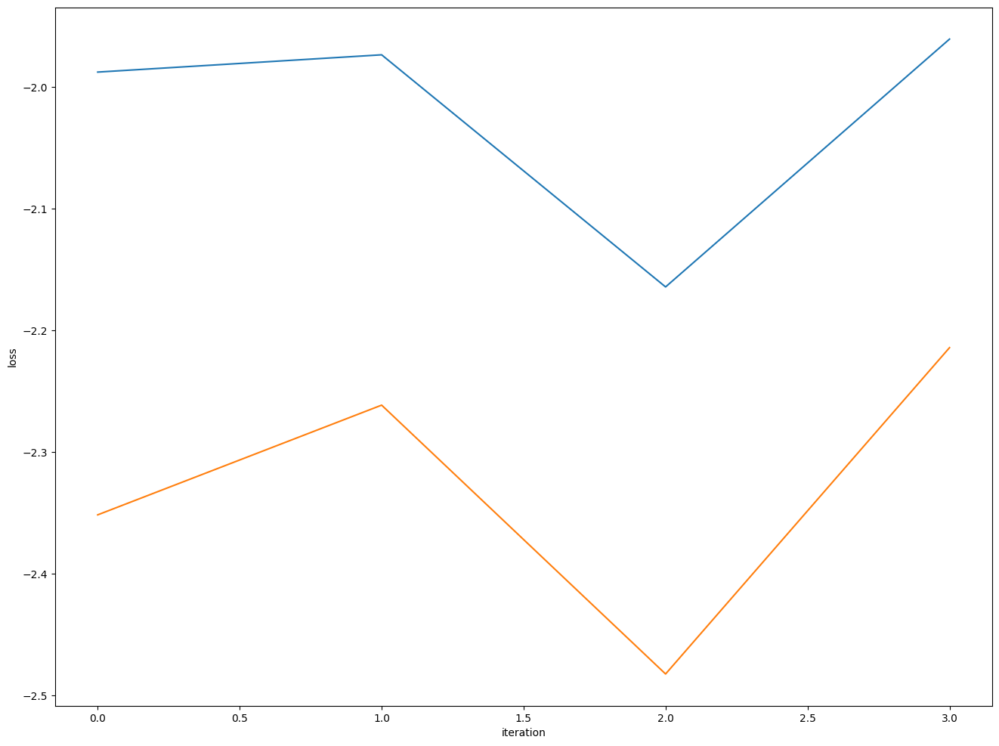

In [50]:
normalized_loss_array = np.array(normalized_loss_list)
plt.figure(figsize=(16,12))
plt.plot(normalized_loss_array[:,0])
plt.plot(normalized_loss_array[:,1])
plt.xlabel("iteration")
plt.ylabel("loss")
plt.savefig(figfilenamehead+"learning_curve_normalized_"+env_str+".png")
plt.savefig(figfilenamehead+"learning_curve_normalized_"+env_str+".eps")
# plt.savefig(figfilenamehead+"policy_evaluartion_learning_curve_normalized_"+env_str+".pdf")

In [51]:
print(iwvi.dec.state_dict()['net_phat.0.weight'].sum())

tensor(1.1789)
